# ECDFS-DP2v1: pS pipeline with smooth fitting (DP2 data)
This notebook mirrors `ECDFS-DP1v1.ipynb` but uses only the new DP2 data.
Available DP2 fields: **ECDFS** and **COSMOS** (no DP2 data for EDFS or SV95_25).

The pS model uses smooth Sesar/polynomial abstractions (Task 2) — identical
methodology to the DP1 v1 notebook.

In [1]:
## automatically reload any modules read below that might have changed (e.g. plots)
%reload_ext autoreload
%autoreload 2

In [2]:
from astropy.table import Table
import matplotlib.pyplot as plt
import os
import pandas as pd
from functools import partial
import numpy as np
import re
from astropy.coordinates import SkyCoord
from astropy import units as u

In [3]:
import sys
sys.path.append('../src')
import modelLocusTools as mlt 
import pipeline as pipl
import plotting as pl

In [4]:
import data_processing as dp
import dist_dens as dd
from config import *

---

In [5]:
field = pd.DataFrame({
    'Field Code': ['ECDFS', 'COSMOS'],
    'ra':  [53.09, 150.25],
    'dec': [-27.51, 2.23],
})

coords = SkyCoord(
    ra  = field['ra'].values * u.deg,
    dec = field['dec'].values * u.deg,
    frame='icrs'
)

field['l'] = coords.galactic.l.deg
field['b'] = coords.galactic.b.deg
field

,Field Code,ra,dec,l,b
0,ECDFS,53.09,-27.51,223.060137,-54.415378
1,COSMOS,150.25,2.23,236.898148,42.242097


---

In [6]:
c_coo_ECDFS  = SkyCoord(53.09, -27.51, unit='deg', frame='icrs')
c_coo_COSMOS = SkyCoord(150.25, 2.23, unit='deg', frame='icrs')
c_coo = [c_coo_ECDFS, c_coo_COSMOS]

# Loading the data

In [7]:
fields = ['DP2_ECDFS_objects', 'DP2_COSMOS_objects']
field_labels = ['ECDFS', 'COSMOS']
data = [pipl.load_csv_dp2(f'../data/{i}.fits') for i in fields]
data[1].head()

,objectId,coord_ra,coord_dec,ebv,refBand,refExtendedness,detect_fromBlend,detect_isIsolated,parentObjectId,u_psfFlux,...,y_extendedness_flag,y_blendedness,y_blendedness_flag,y_pixelFlags_inexact_psfCenter,g_cModelMag,g_cModelMagErr,r_cModelMag,r_cModelMagErr,i_cModelMag,i_cModelMagErr
0,788010362900318671,150.930472,1.488274,0.026183,b'i',0.0,False,True,0,37.689739,...,True,NaN,True,False,26.496537,0.158418,25.345144,0.070689,25.315547,0.105648
1,788010362900318679,150.941913,1.488350,0.026330,b'i',1.0,False,True,0,-15.317045,...,True,0.011235,True,False,28.788401,1.698518,28.704317,1.789533,25.905435,0.224598
2,788010362900318691,150.948242,1.488776,0.026455,b'i',1.0,False,True,0,-28.197121,...,True,0.000000,True,False,27.308365,0.334380,26.121324,0.143641,26.034796,0.205399
3,788010362900318707,150.963171,1.489260,0.026808,b'g',1.0,False,True,0,114.782349,...,True,NaN,True,False,25.462370,0.067000,25.327279,0.078824,25.417572,0.127100
4,788010362900318708,150.986988,1.489517,0.027286,b'i',1.0,False,True,0,504.678833,...,False,0.000000,False,False,24.042238,0.022368,23.527614,0.017884,23.137469,0.019768


In [8]:
field['total num objects'] = [len(data[i]) for i in range(len(fields))]
field['total num objects'] = field['total num objects'].astype(int)
field

,Field Code,ra,dec,l,b,total num objects
0,ECDFS,53.09,-27.51,223.060137,-54.415378,732402
1,COSMOS,150.25,2.23,236.898148,42.242097,865287


# Magnitude calculations

In [9]:
data_mag = [pipl.magnitude_calculations(i, i['ebv']*3.10/1.20) for i in data]
data_mag[0].head()

/Users/jinshuozhang/Rubin-Work/lsst_stack/conda/envs/lsst-scipipe-10.1.0/lib/python3.12/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/Users/jinshuozhang/Rubin-Work/lsst_stack/conda/envs/lsst-scipipe-10.1.0/lib/python3.12/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/Users/jinshuozhang/Rubin-Work/lsst_stack/conda/envs/lsst-scipipe-10.1.0/lib/python3.12/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/Users/jinshuozhang/Rubin-Work/lsst_stack/conda/envs/lsst-scipipe-10.1.0/lib/python3.12/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/Users/jinshuozhang/Rubin-Work/lsst_stack/conda/envs/ls

,objectId,coord_ra,coord_dec,ebv,refBand,refExtendedness,detect_fromBlend,detect_isIsolated,parentObjectId,u_psfFlux,...,z_psfRelErr,y_diff,y_psfRelErr,ug,gr,ri,iz,zy,gi,Ar
0,755368611450718607,53.870339,-28.264069,0.009906,b'i',1.0,False,True,0,-146.214035,...,0.219124,-0.298456,6.004529,NaN,0.389896,0.894170,0.789771,-2.204321,1.284066,0.025592
1,755368611450718618,53.911221,-28.263557,0.010324,b'i',1.0,False,True,0,-155.719330,...,0.373825,NaN,-5.118841,NaN,-0.043961,0.715757,0.356879,NaN,0.671796,0.026671
2,755368611450718619,53.909665,-28.263455,0.010325,b'i',1.0,False,True,0,290.921814,...,0.440887,0.694628,1.482334,-1.214183,1.038915,0.007553,-0.108162,1.243014,1.046467,0.026672
3,755368611450718634,53.860472,-28.263186,0.009755,b'i',0.0,False,True,0,-11.530412,...,0.346438,NaN,-0.497404,NaN,0.094620,0.250152,0.521030,NaN,0.344772,0.025200
4,755368611450718656,53.854941,-28.262432,0.009667,b'i',1.0,False,True,0,-209.525146,...,-1.332346,0.112528,0.920064,NaN,NaN,NaN,NaN,NaN,NaN,0.024973


# Compare color-magnitude diagrams for unresolved and resolved sources
# Unresolved objects are selected as mag$_{psf}$-mag$_{CModel} <$0.016  

/Users/jinshuozhang/Library/CloudStorage/Dropbox/Rubin-Work/Rubin-star-galaxy-classification/star-galaxy-separation/notebooks/../src/plotting.py:177: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['rmag'] = df[f'r{model_flux_mag}']
/Users/jinshuozhang/Library/CloudStorage/Dropbox/Rubin-Work/Rubin-star-galaxy-classification/star-galaxy-separation/notebooks/../src/plotting.py:178: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gr'] = df[f'g{model_flux_mag}'] - df[f'r{model_flux_mag}']
/Users/jinshuozhang

row= 0 all: 286993  S: 21122  G: 265799
 for r<24:
       all: 128266  S: 10874  G: 117350


/Users/jinshuozhang/Library/CloudStorage/Dropbox/Rubin-Work/Rubin-star-galaxy-classification/star-galaxy-separation/notebooks/../src/plotting.py:177: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['rmag'] = df[f'r{model_flux_mag}']
/Users/jinshuozhang/Library/CloudStorage/Dropbox/Rubin-Work/Rubin-star-galaxy-classification/star-galaxy-separation/notebooks/../src/plotting.py:178: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gr'] = df[f'g{model_flux_mag}'] - df[f'r{model_flux_mag}']
/Users/jinshuozhang

row= 1 all: 312875  S: 26723  G: 286141
 for r<24:
       all: 144377  S: 16189  G: 128183


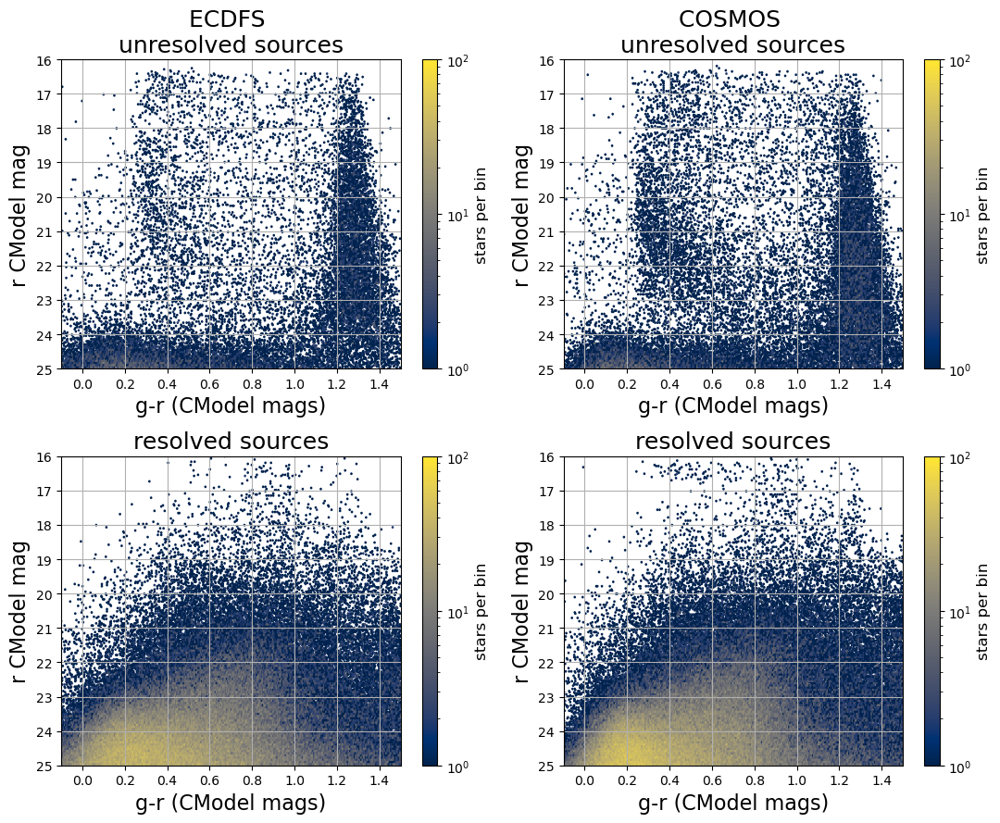

In [10]:
pl.plot_compareCMDs(data, 'compareCMDs_DP2_ECDFSandCOSMOS.png', fields=[0, 1],
                    field_names=['ECDFS', 'COSMOS'])

## Show mag$_{psf}$-mag$_{CModel}$ magnitude difference plots

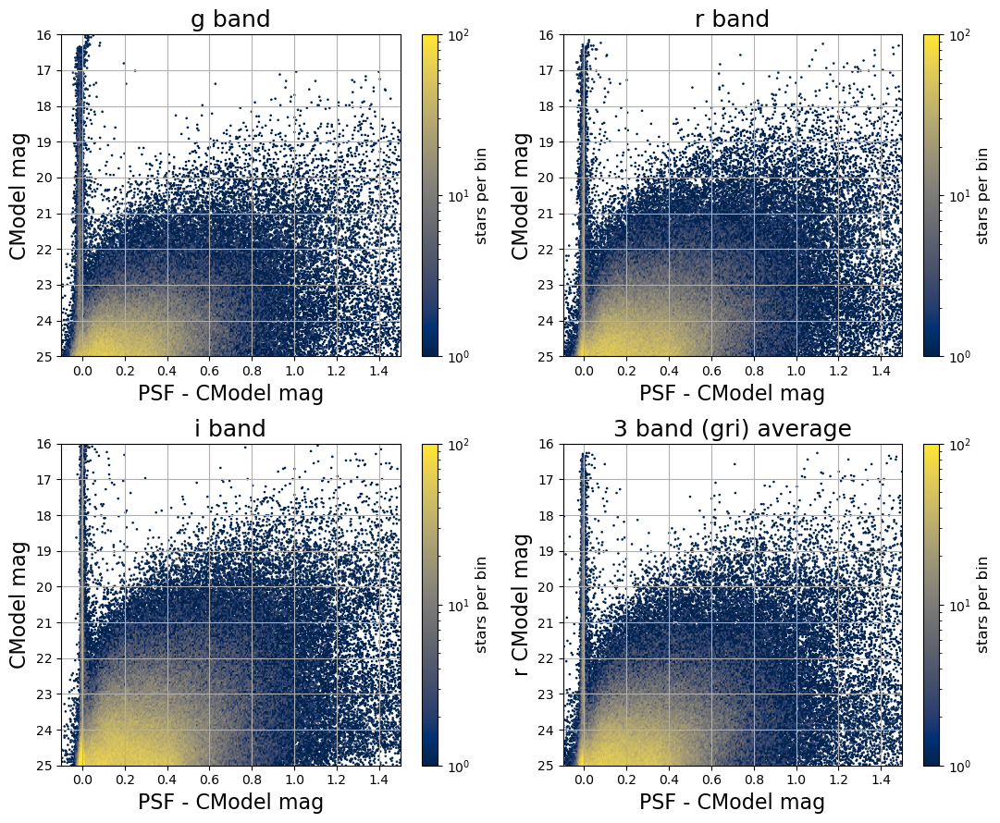

In [11]:
pl.plot_mag_diff(data[0], 'mag_diff_DP2_ECDFS.png')

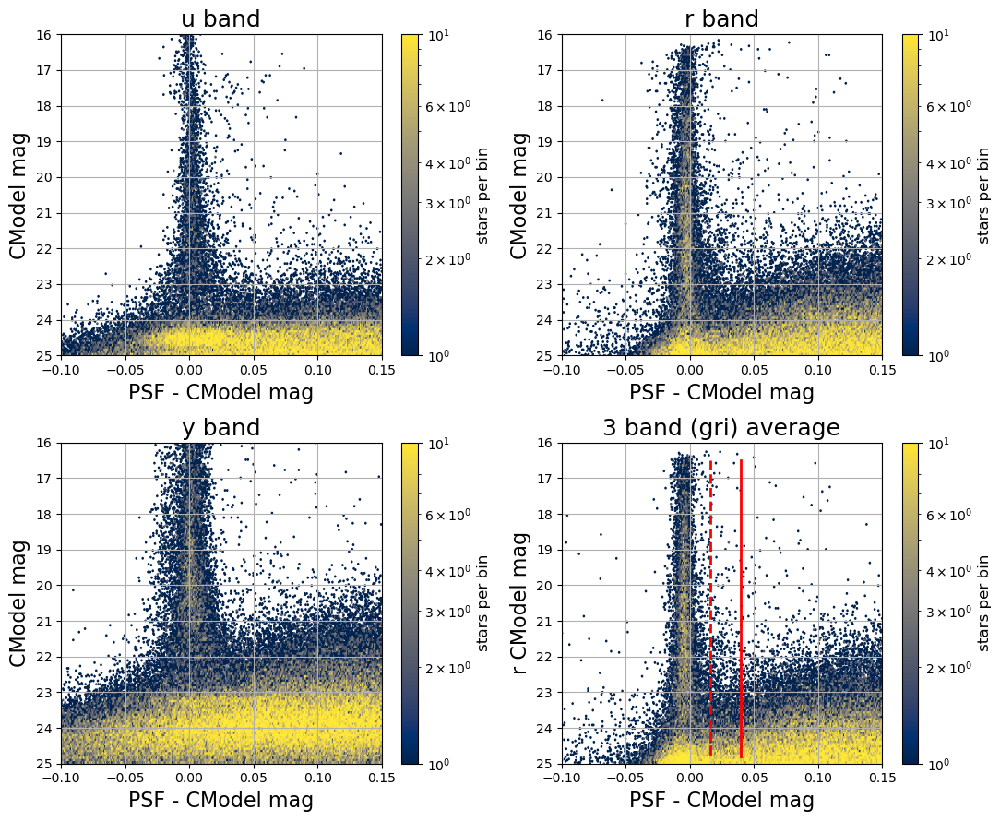

In [12]:
extent=[-0.1, 0.15, 14, 25]
cmap='cividis'
file_path='../plots/'
filters=['u', 'r', 'y']
pl.plot_mag_diff2(data[0], 'mag_diff_DP2_ECDFSzoom.png', extent=extent, cmap=cmap, file_path=file_path, filters=filters)

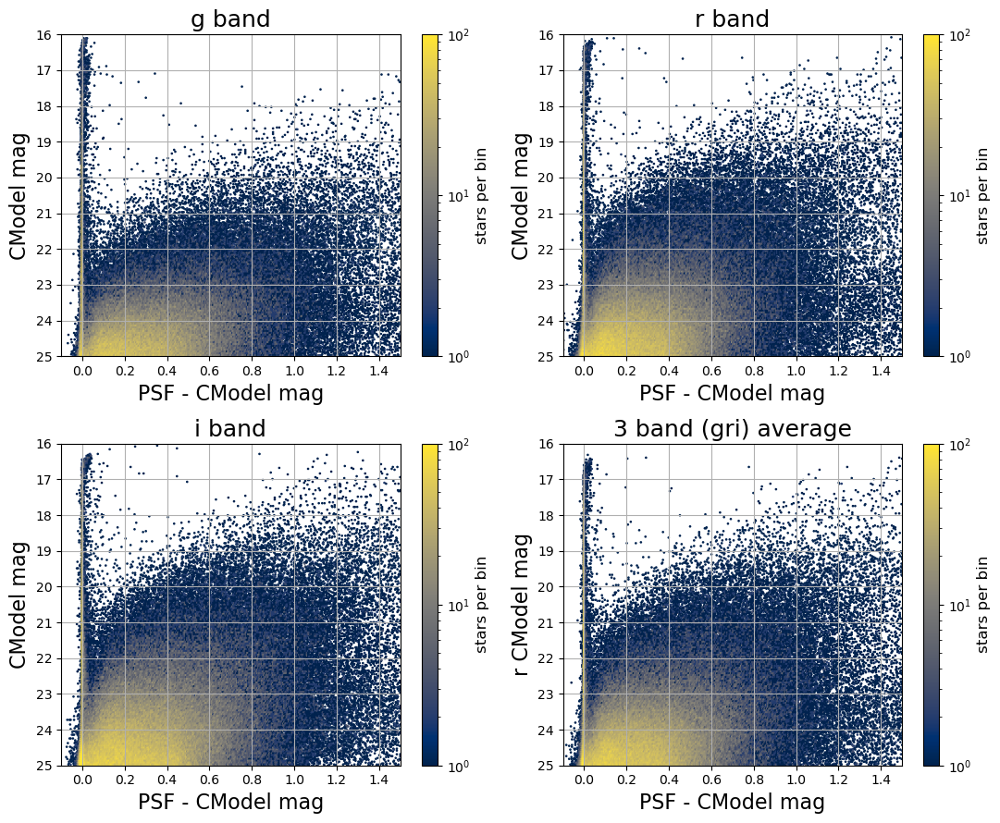

In [13]:
pl.plot_mag_diff(data[1], 'mag_diff_DP2_COSMOS.png')

## We want to limit the range for PSF-CModel from -0.5 to 1.5, and Cmodel mag to < 25
### (for DP1 dataset, eventually <27 for 10-year LSST).

## Show what how data (mosly junk) look beyond these limits:

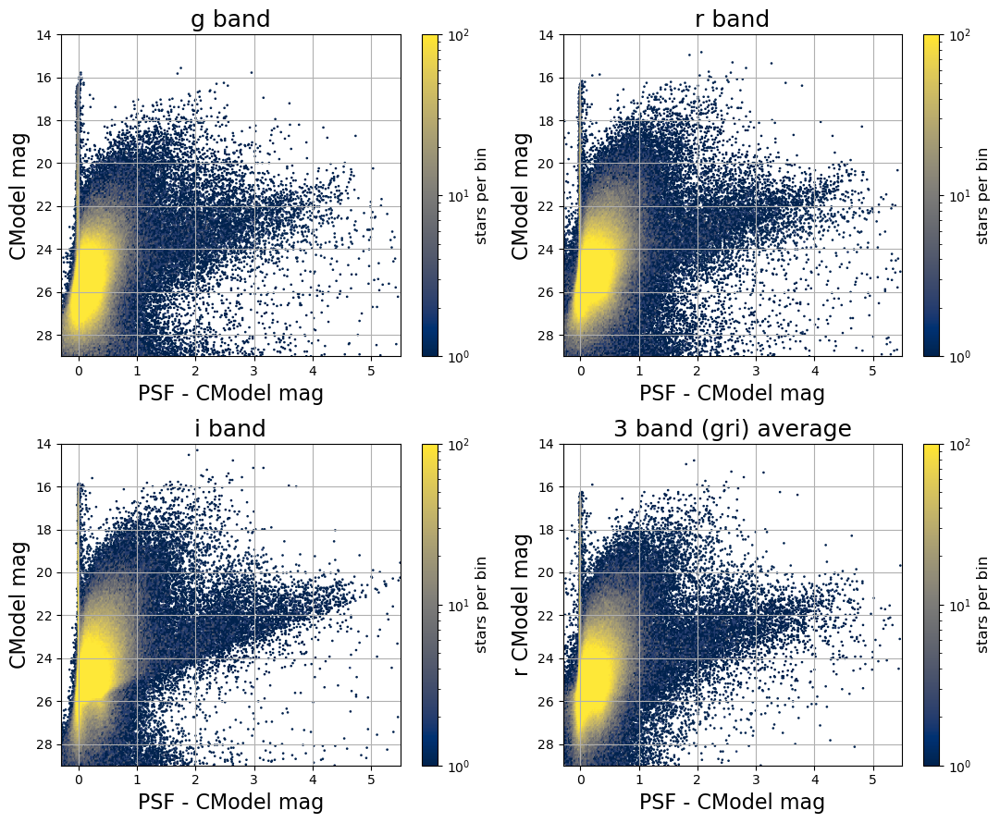

In [14]:
pl.plot_mag_diff(data[0], 'mag_diff_DP2_ECDFS_wide.png', extent=[-0.3, 5.5, 14, 29])

## Develop a tool to fit an arbitrary observed distribution in the CModel vs. PSF-CModel diagram using a two component model (in each filter, ugrizy, separately): 


### 1) first fit PSF-CModel histograms for slices of CModel using one Gaussian centered on 0 and 1-3 Gaussians to model extended sources; use these CModel bins: <18, 18-19, 19-20, 20-21, 21-22, 22-23, 23-24, 24-25; free model parameters are the width for the unresolved source distribution (location is fixed to 0), and parameters describing resolved source distribution. Show data histogram and the best fit model for each CModel bin.
### 2) using best-fit models for these CModel mag bins, test if the CModel dependence can be abstracted too using some convenient fitting form
### 3) using the final model, produce and plot 2D histogram for data distribution and make the 2D model and data-model residuals plot (similar to the two right panels in fig. 10 from http://faculty.washington.edu/ivezic/Publications/Slater_2020_AJ_159_65.pdf) 

### 4) given the best 2D model, return pS = (unresolved model component) / (total 2D model) for two input arrays of PSF-CModel and CModel. Test by providing the same arrays as for constructing the 2D model and plot the median pS per pixel in the CModel vs. PSF-CModel diagram. 


## Notes:

### The tool must take the ranges of PSF-CModel and CModel as inputs (defaults are  -0.5 to 1.5, and Cmodel mag from 15 to 25. 

### ECDFS field is good for developing this tool; COSMOS is good for testing. 


### For fitting a sum (mixture)  of Gaussians fitting, see 
https://www.astroml.org/book_figures/chapter4/fig_GMM_1D.html 

### For 2D histograms, see the right panel in https://www.astroml.org/book_figures/chapter4/fig_lyndenbell_toy.html

### The ultimate test will be using this tool on Rubin DP2 data for COSMOS field, and measuring performance using classification labels based on HST COSMOS data. The result of this measurement will look similar to fig. 11 from http://faculty.washington.edu/ivezic/Publications/Slater_2020_AJ_159_65.pdf.

### Import the new fitting tool

In [15]:
import psf_cmodel_fit as pcf

## Task 1: Fit PSF-CModel histograms in CModel slices (per filter)
One Gaussian at 0 for unresolved sources (sigma free) plus 2 resolved Gaussians (location, width, weight free). CModel bins: <18, 18-19, ..., 24-25.

--- fitting filter u ---


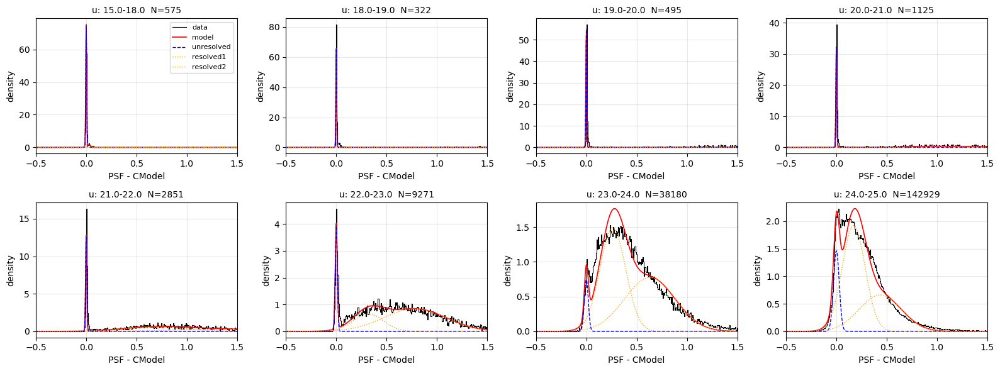

--- fitting filter g ---


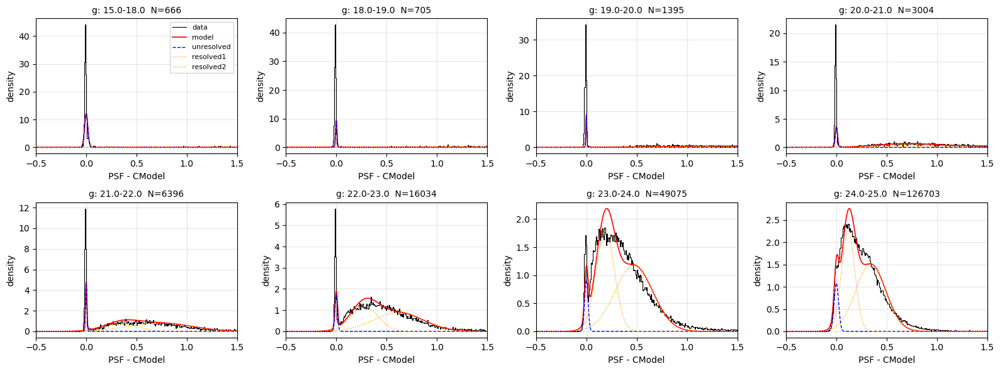

--- fitting filter r ---


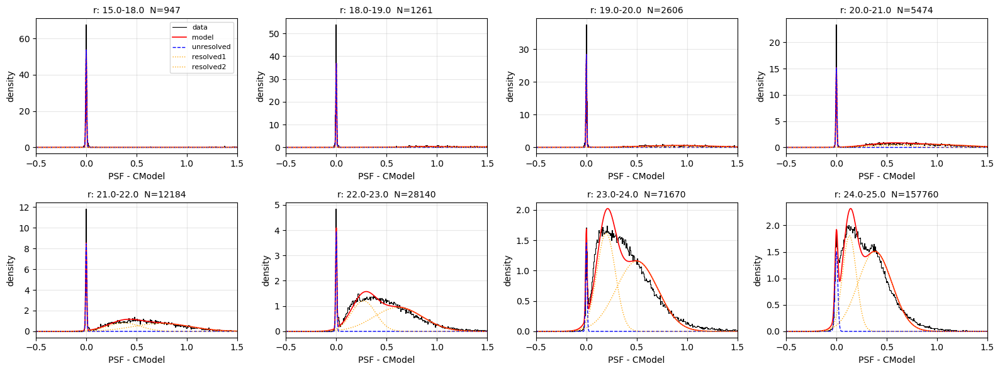

--- fitting filter i ---


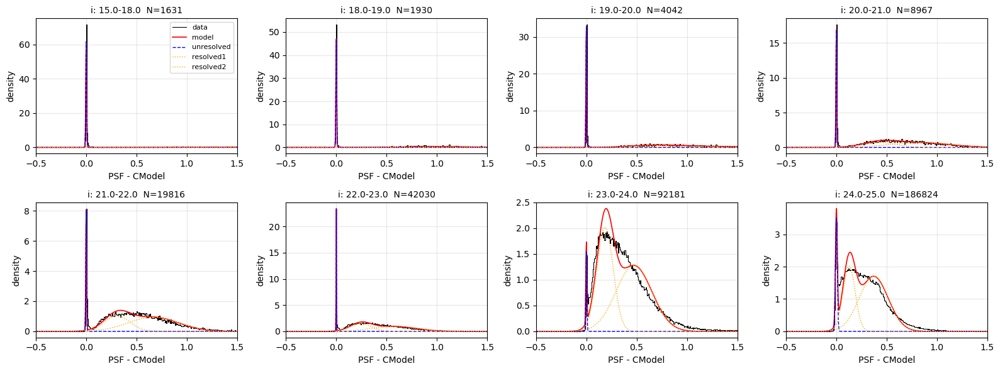

--- fitting filter z ---


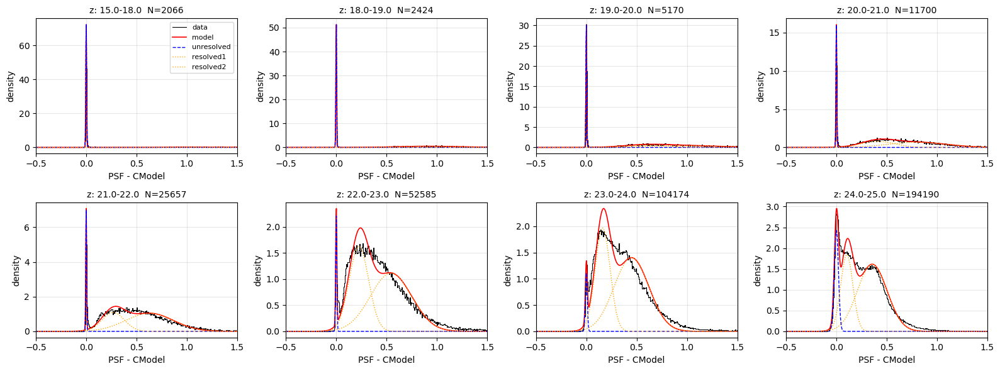

--- fitting filter y ---


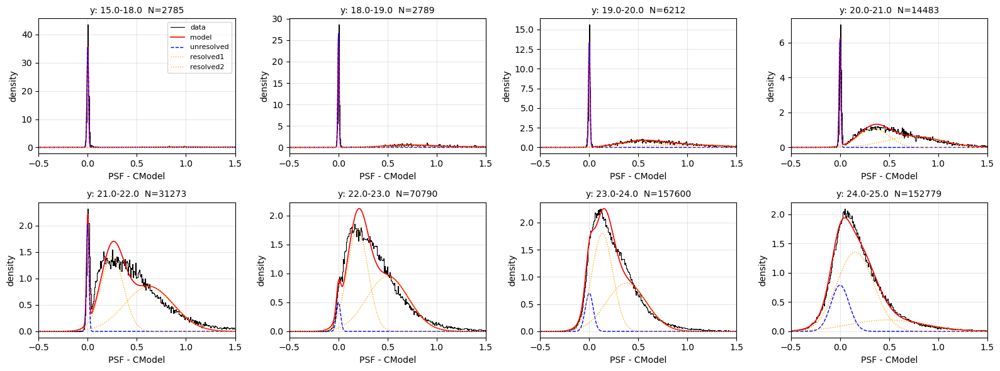

In [16]:
# ECDFS (data_mag[0]) is the development field.
# Two resolved Gaussians usually suffice; bump to 3 for worse-behaved bands.
slice_fits = {}
for band in ['u', 'g', 'r', 'i', 'z', 'y']:
    print(f'--- fitting filter {band} ---')
    slice_fits[band] = pcf.fit_slices(data_mag[0], band, n_resolved=2)
    pcf.plot_slice_fits(slice_fits[band], band,
                        name=f'slice_fits_DP2_ECDFS_{band}.png')

## Task 2: Abstract CModel dependence with a smooth form
For the unresolved locus width `sigmaU(m)` we use the photometric-error form from Sesar et al. 2007 (eq. 5, p. 2238):

$$\sigma(m) = \sqrt{\sigma_0^2 + a^2 \cdot 10^{\,b\,(m - 25)}}$$

Fitting is done on the magnitude offset $x = m - 25$ instead of raw $m$ to keep the exponential $O(1)$ near the survey depth and avoid numerical instabilities. The remaining mixture parameters (`wR_k`, `muR_k`, `sigmaR_k`) are still fit as polynomials in CModel so the model stays continuous.

--- u: parameter polynomials ---


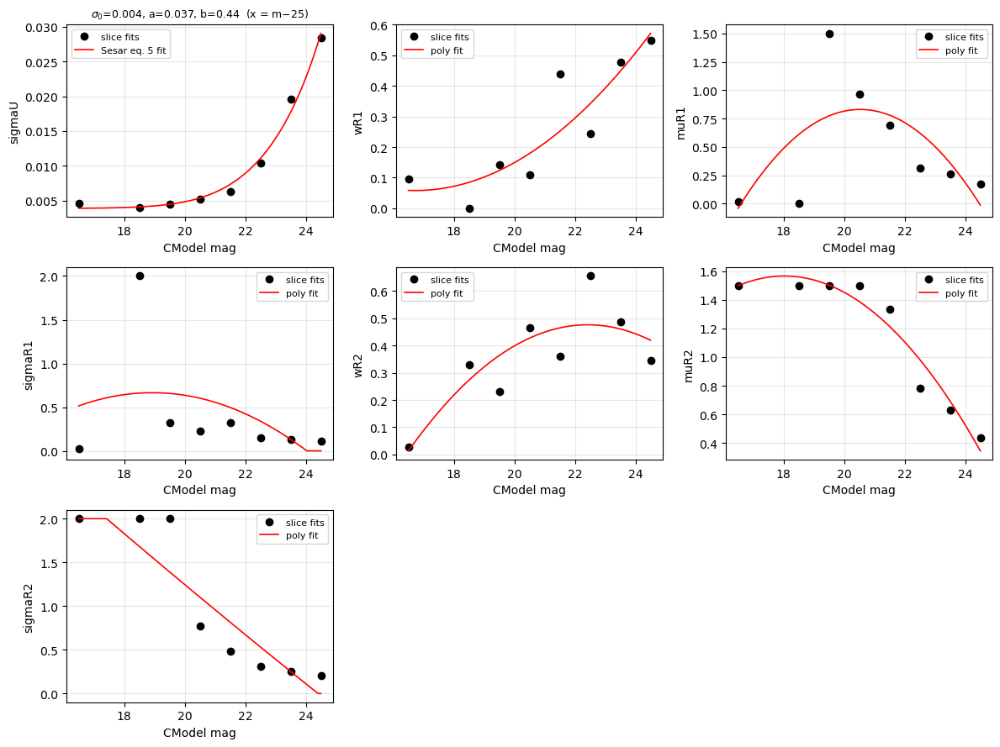

--- g: parameter polynomials ---


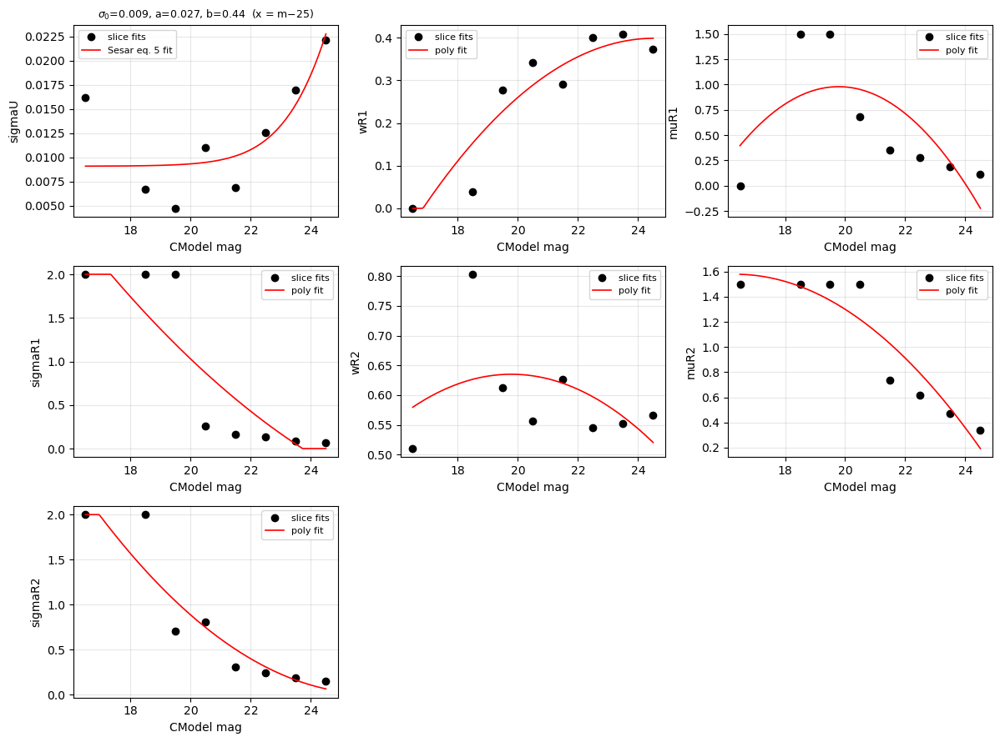

--- r: parameter polynomials ---


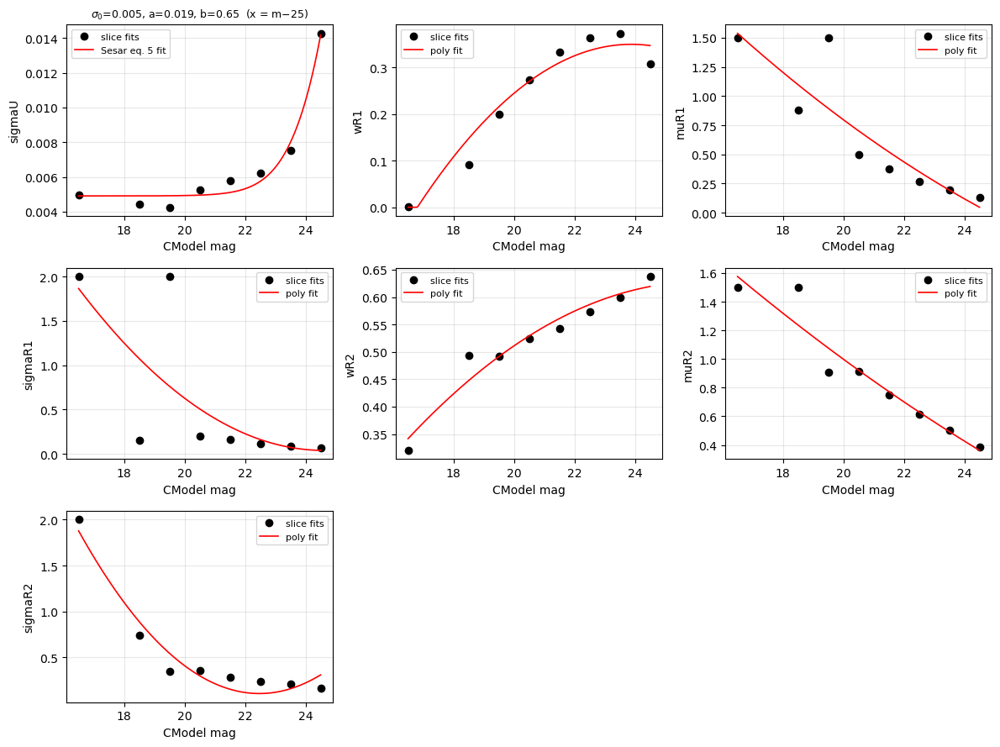

--- i: parameter polynomials ---


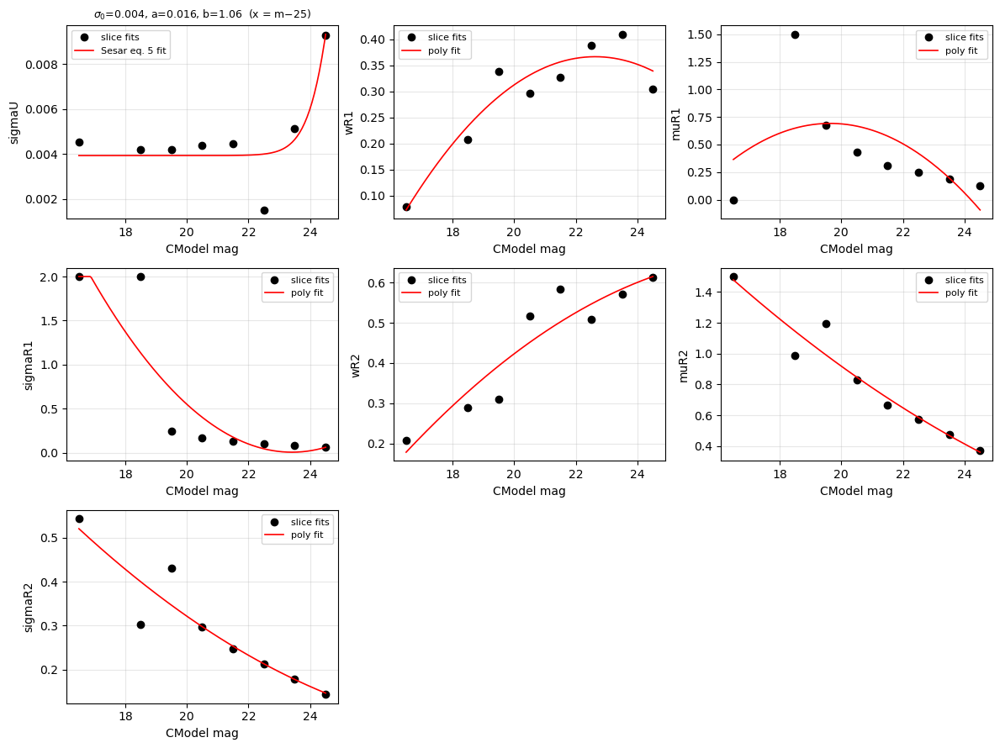

--- z: parameter polynomials ---


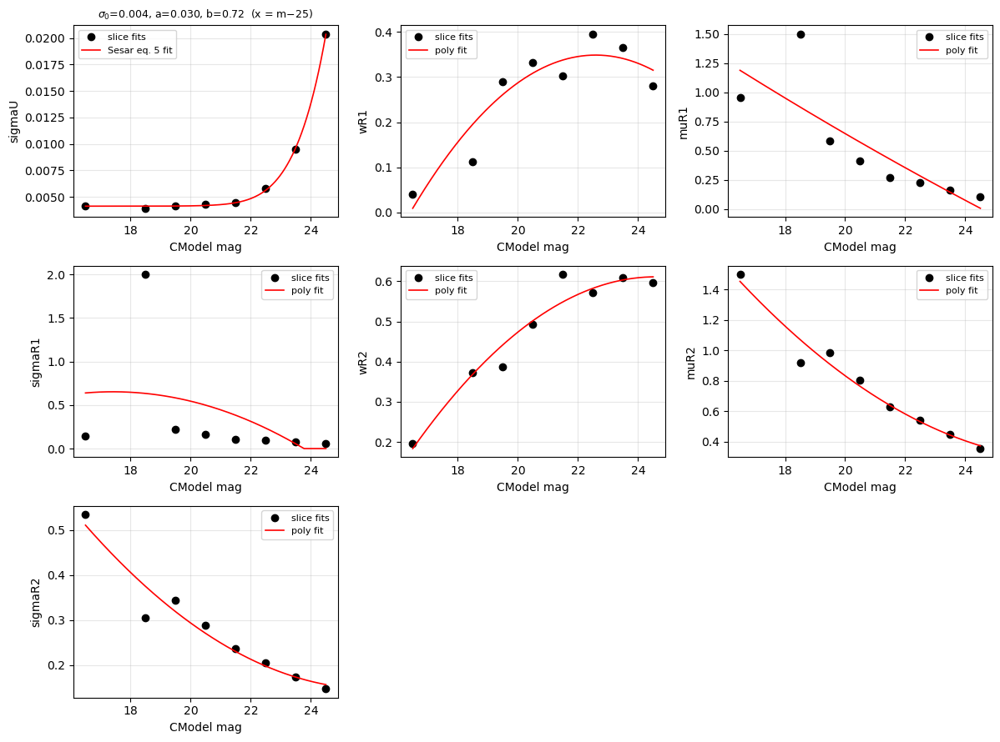

--- y: parameter polynomials ---


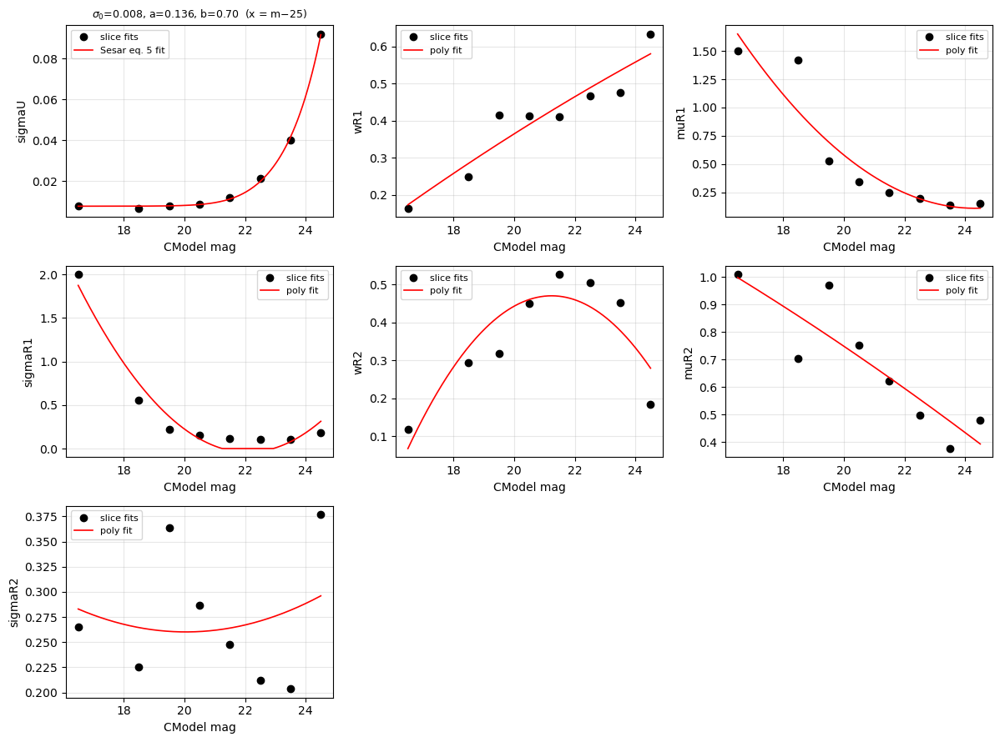

In [17]:
abs_models = {}
for band, fits in slice_fits.items():
    abs_models[band] = pcf.abstract_cmodel_dependence(fits, poly_deg=2)
    print(f'--- {band}: parameter polynomials ---')
    pcf.plot_param_curves(abs_models[band],
                          name=f'param_curves_DP2_ECDFS_{band}.png')

## Task 3: 2D data, 2D model, and residuals
Three-panel plot per filter (cf. right panels of fig. 10 in Slater+ 2020).

--- 2D model vs data: u ---


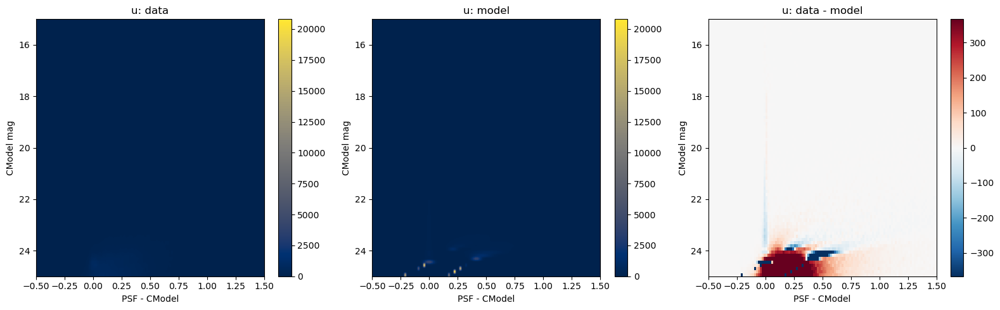

--- 2D model vs data: g ---


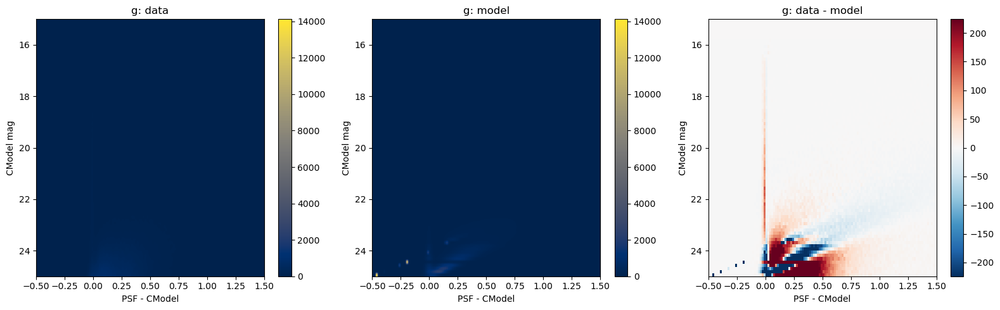

--- 2D model vs data: r ---


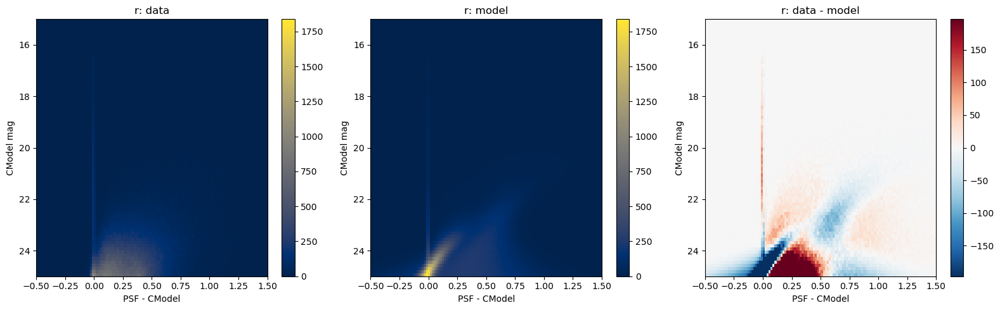

--- 2D model vs data: i ---


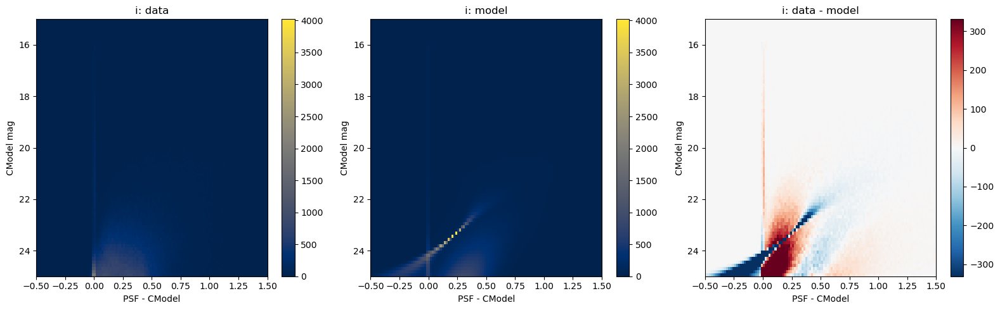

--- 2D model vs data: z ---


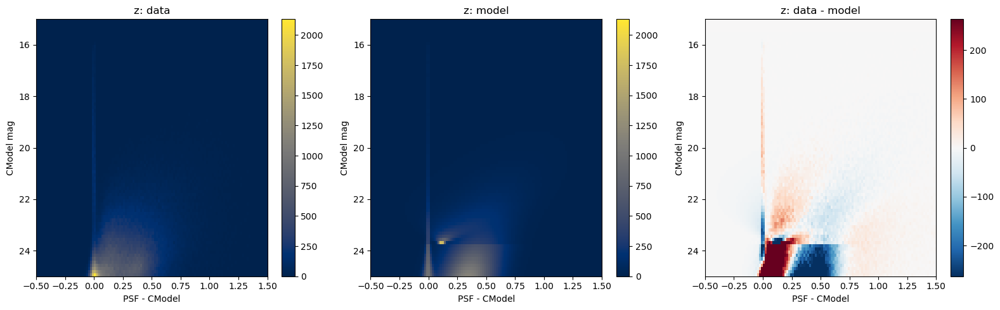

--- 2D model vs data: y ---


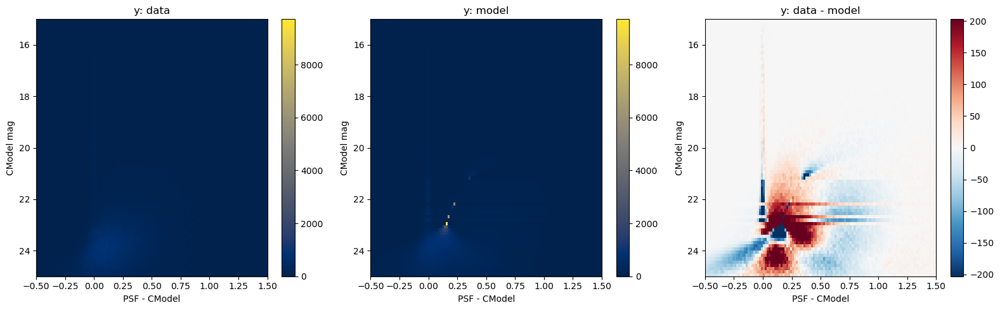

In [18]:
residuals_2d = {}
for band in ['u', 'g', 'r', 'i', 'z', 'y']:
    print(f'--- 2D model vs data: {band} ---')
    residuals_2d[band] = pcf.plot_2d_model_residuals(
        data_mag[0], band, abs_models[band],
        name=f'model2D_DP2_ECDFS_{band}.png')

## Task 4: pS = P(unresolved) / P(total) and its median-per-pixel map
pS is returned for arbitrary (PSF-CModel, CModel) input arrays. As a self-test we feed back the ECDFS photometry and plot the median pS per pixel.

--- pS map: u ---


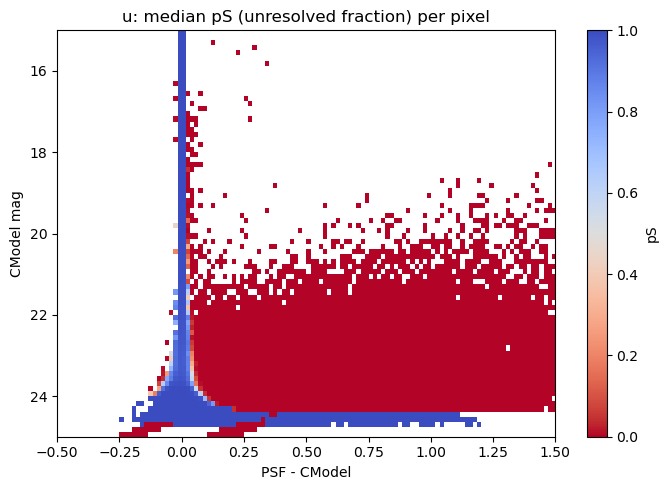

--- pS map: g ---


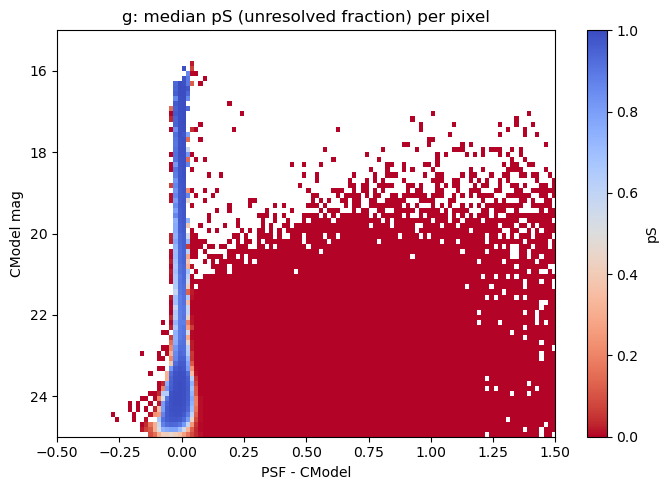

--- pS map: r ---


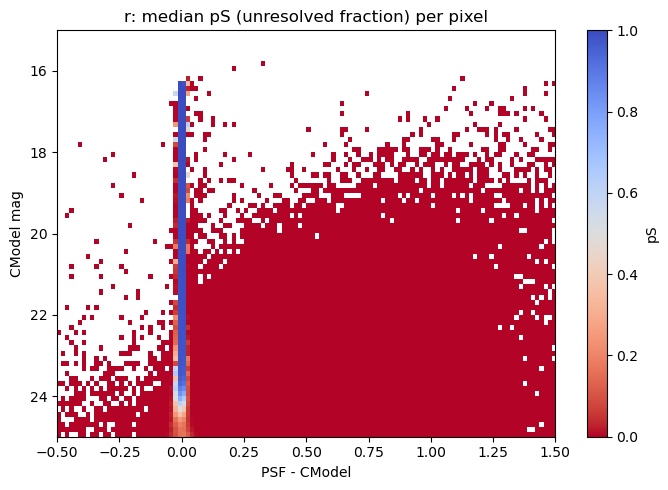

--- pS map: i ---


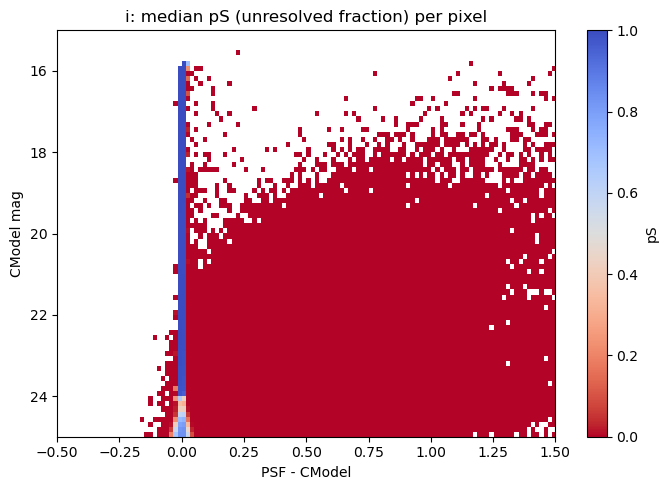

--- pS map: z ---


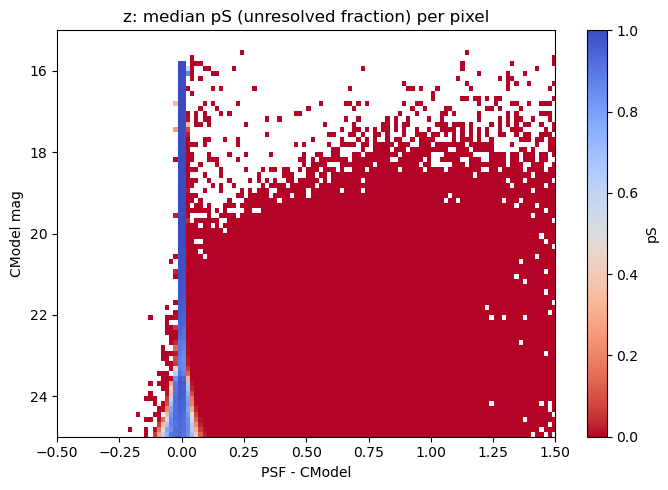

--- pS map: y ---


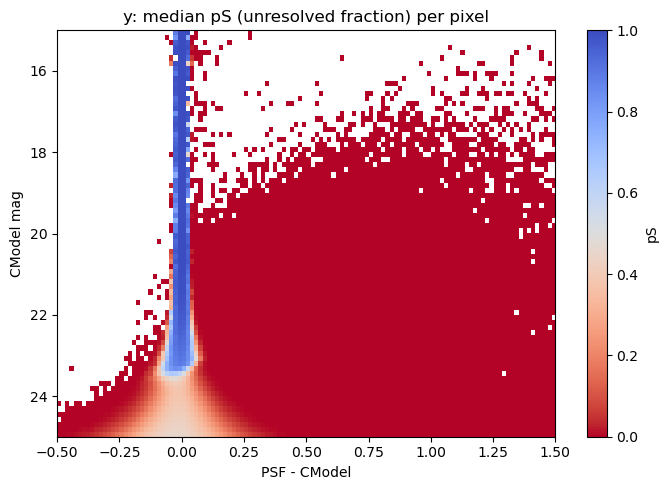

In [19]:
# Self-test: compute pS for the same arrays that built the 2D model
# and plot median pS per pixel in the CModel vs. PSF-CModel diagram.
pS_maps = {}
for band in ['u', 'g', 'r', 'i', 'z', 'y']:
    print(f'--- pS map: {band} ---')
    pS_maps[band] = pcf.plot_pS_map(
        data_mag[0], band, abs_models[band],
        name=f'pS_map_DP2_ECDFS_{band}.png')

In [20]:
# Sanity check: verify compute_pS works on arbitrary arrays too
dm_test = np.array([0.0, 0.05, 0.2, 0.8, 1.2])
cm_test = np.array([18.0, 20.0, 22.0, 23.0, 24.0])
pS_test = pcf.compute_pS(dm_test, cm_test, abs_models['r'])
for dm_v, cm_v, ps in zip(dm_test, cm_test, pS_test):
    print(f'PSF-CModel={dm_v:+.2f}, CModel={cm_v:.1f}  ->  pS={ps:.3f}')

PSF-CModel=+0.00, CModel=18.0  ->  pS=0.997
PSF-CModel=+0.05, CModel=20.0  ->  pS=0.000
PSF-CModel=+0.20, CModel=22.0  ->  pS=0.000
PSF-CModel=+0.80, CModel=23.0  ->  pS=0.000
PSF-CModel=+1.20, CModel=24.0  ->  pS=0.000


## EXTERNAL LABEL INTEGRATION WITH ALL AVAILABLE FILTERS
This add-on leaves the Rubin-side workflow above unchanged. It attaches the clean ECDFS HST/3D-HST matched labels to `data_mag[0]`, computes Rubin-side `pS` for every usable band in `u g r i z y`, and then saves the per-band external-label validation plots for each available filter.

In [21]:
import importlib
import sys

if 'external_label_tools' in sys.modules:
    del sys.modules['external_label_tools']

import external_label_tools as elt
elt = importlib.reload(elt)

if '_score_col_for_band' not in elt.__dict__:
    def _score_col_for_band(band, score_prefix='pS_', score_suffix=None):
        if score_suffix is not None:
            return f'{band}{score_suffix}'
        return f'{score_prefix}{band}'
    elt._score_col_for_band = _score_col_for_band

from pathlib import Path

MATCHED_LABEL_PATH = Path('../data/hst_dp1_matched_clean_ellipse.csv')
if not MATCHED_LABEL_PATH.exists():
    raise FileNotFoundError(f'External label table not found: {MATCHED_LABEL_PATH}')

# DP2 objectIds differ from DP1, so we cross-match by sky position
# instead of using elt.attach_external_labels (which joins on objectId).
hst_table = pd.read_csv(MATCHED_LABEL_PATH)
hst_table = hst_table.dropna(subset=['hst_ra', 'hst_dec', 'hst_label'])
hst_table = hst_table[hst_table['hst_label'].isin(['star', 'galaxy'])].copy()

hst_coords = SkyCoord(ra=hst_table['hst_ra'].values*u.deg,
                       dec=hst_table['hst_dec'].values*u.deg, frame='icrs')
dp2_coords = SkyCoord(ra=data_mag[0]['coord_ra'].values*u.deg,
                       dec=data_mag[0]['coord_dec'].values*u.deg, frame='icrs')

idx, sep2d, _ = hst_coords.match_to_catalog_sky(dp2_coords)
max_sep = 1.0 * u.arcsec
good_match = sep2d < max_sep

print(f'HST sources with star/galaxy labels: {len(hst_table)}')
print(f'Matched within {max_sep}: {good_match.sum()}')

matched_dp2_idx = idx[good_match]
matched_hst = hst_table.iloc[good_match.nonzero()[0]].copy()
matched_hst['dp2_idx'] = matched_dp2_idx
matched_hst['match_sep_arcsec'] = sep2d[good_match].arcsec

# Keep closest match per DP2 object
matched_hst = matched_hst.sort_values('match_sep_arcsec').drop_duplicates(subset='dp2_idx', keep='first')

ecdfs_labeled = data_mag[0].copy()
ecdfs_labeled['external_label'] = pd.array([np.nan] * len(ecdfs_labeled), dtype=object)
ecdfs_labeled['match_sep_arcsec'] = np.nan
ecdfs_labeled.loc[ecdfs_labeled.index[matched_hst['dp2_idx'].values], 'external_label'] = matched_hst['hst_label'].values
ecdfs_labeled.loc[ecdfs_labeled.index[matched_hst['dp2_idx'].values], 'match_sep_arcsec'] = matched_hst['match_sep_arcsec'].values

ecdfs_labeled_use = ecdfs_labeled[ecdfs_labeled['external_label'].isin(['star', 'galaxy'])].copy()

print(f'ECDFS DP2 Rubin rows: {len(data_mag[0])}')
print(f'ECDFS DP2 rows with external labels: {len(ecdfs_labeled_use)}')
elt.summarize_external_labels(ecdfs_labeled)

HST sources with star/galaxy labels: 18273
Matched within 1.0 arcsec: 14129
ECDFS DP2 Rubin rows: 732402
ECDFS DP2 rows with external labels: 13831


,external_label,count
0,unmatched,718571
1,galaxy,13473
2,star,358


In [22]:
all_ps_bands = ['u', 'g', 'r', 'i', 'z', 'y']
abs_models_multiband = {band: abs_models[band] for band in all_ps_bands if 'abs_models' in globals() and band in abs_models}
available_ps_bands = []

for band in all_ps_bands:
    diff_col = f'{band}_diff'
    mag_col = f'{band}_modelFlux_mag'
    if diff_col not in ecdfs_labeled_use.columns or mag_col not in ecdfs_labeled_use.columns:
        print(f'Skipping {band}: missing Rubin columns')
        continue
    if band not in abs_models_multiband:
        print(f'Building fallback abs_model for {band} band ...')
        fits_band = pcf.fit_slices(data_mag[0], band, n_resolved=2)
        abs_models_multiband[band] = pcf.abstract_cmodel_dependence(fits_band, poly_deg=2)
    ecdfs_labeled_use[f'pS_{band}'] = pcf.compute_pS(
        ecdfs_labeled_use[diff_col].to_numpy(),
        ecdfs_labeled_use[mag_col].to_numpy(),
        abs_models_multiband[band],
    )
    available_ps_bands.append(band)

print('Available pS bands:', available_ps_bands)
preview_cols = ['objectId', 'external_label', 'match_sep_arcsec']
for band in available_ps_bands:
    preview_cols.extend([f'{band}_diff', f'{band}_modelFlux_mag', f'pS_{band}'])
ecdfs_labeled_use[preview_cols].head()

Available pS bands: ['u', 'g', 'r', 'i', 'z', 'y']


/Users/jinshuozhang/Rubin-Work/lsst_stack/conda/envs/lsst-scipipe-10.1.0/lib/python3.12/site-packages/numpy/lib/_polynomial_impl.py:778: RuntimeWarning: invalid value encountered in multiply
  y = y * x + pv
/Users/jinshuozhang/Rubin-Work/lsst_stack/conda/envs/lsst-scipipe-10.1.0/lib/python3.12/site-packages/numpy/lib/_polynomial_impl.py:778: RuntimeWarning: invalid value encountered in multiply
  y = y * x + pv
/Users/jinshuozhang/Rubin-Work/lsst_stack/conda/envs/lsst-scipipe-10.1.0/lib/python3.12/site-packages/numpy/lib/_polynomial_impl.py:778: RuntimeWarning: invalid value encountered in multiply
  y = y * x + pv
/Users/jinshuozhang/Rubin-Work/lsst_stack/conda/envs/lsst-scipipe-10.1.0/lib/python3.12/site-packages/numpy/lib/_polynomial_impl.py:778: RuntimeWarning: invalid value encountered in multiply
  y = y * x + pv


,objectId,external_label,match_sep_arcsec,u_diff,u_modelFlux_mag,pS_u,g_diff,g_modelFlux_mag,pS_g,r_diff,...,pS_r,i_diff,i_modelFlux_mag,pS_i,z_diff,z_modelFlux_mag,pS_z,y_diff,y_modelFlux_mag,pS_y
140824,755370191998684936,galaxy,0.139771,-0.160507,25.832195,NaN,1.051425,28.508030,1.000000,0.078905,...,5.167446e-01,-0.003953,26.087751,5.727861e-01,-0.127180,26.246155,9.172607e-01,0.216873,24.733997,8.624014e-02
140897,755370191998685085,galaxy,0.469101,0.811854,26.708431,NaN,0.366624,26.192657,1.000000,0.558192,...,6.249328e-80,0.402553,25.211662,8.257796e-84,0.623828,25.093731,8.359556e-79,0.893930,25.028309,3.548049e-09
140942,755370191998685218,galaxy,0.306403,0.425997,24.896452,NaN,0.167482,26.046680,1.000000,0.243469,...,3.840907e-11,0.250563,24.697685,2.251523e-104,0.216509,24.681501,5.128715e-19,0.644537,26.196230,2.142193e-01
140955,755370191998685260,galaxy,0.231857,0.053457,24.801073,NaN,0.059258,23.926573,0.126244,0.114105,...,1.999764e-39,0.147008,23.428730,1.651372e-226,0.103196,23.490591,9.320908e-26,0.067053,22.977150,2.704574e-01
140979,755370191998685320,galaxy,0.226047,-0.259155,26.311357,NaN,0.022486,25.330591,1.000000,0.036919,...,2.378366e-01,0.065586,25.111042,4.328684e-03,-0.012631,24.824896,9.292976e-01,NaN,NaN,NaN


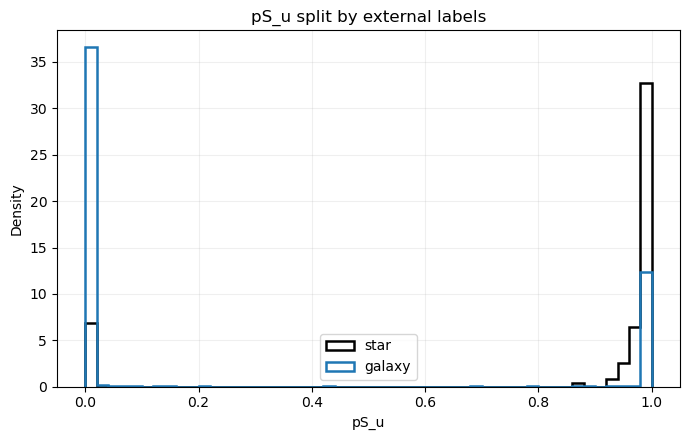

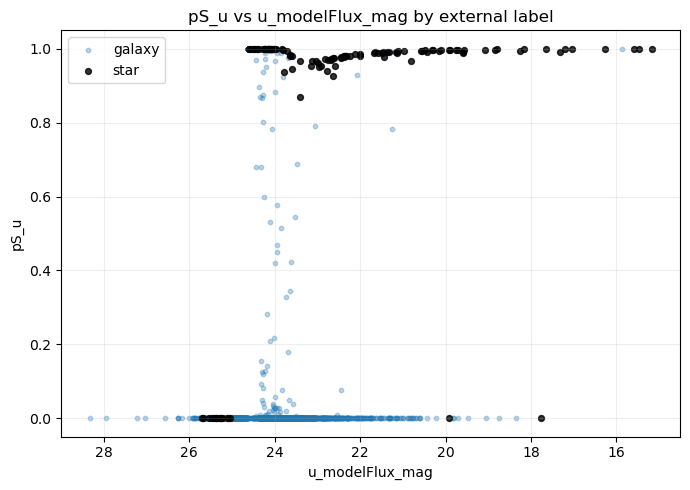

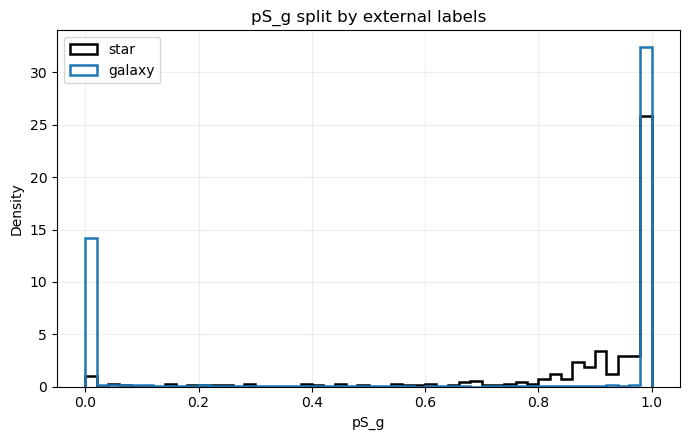

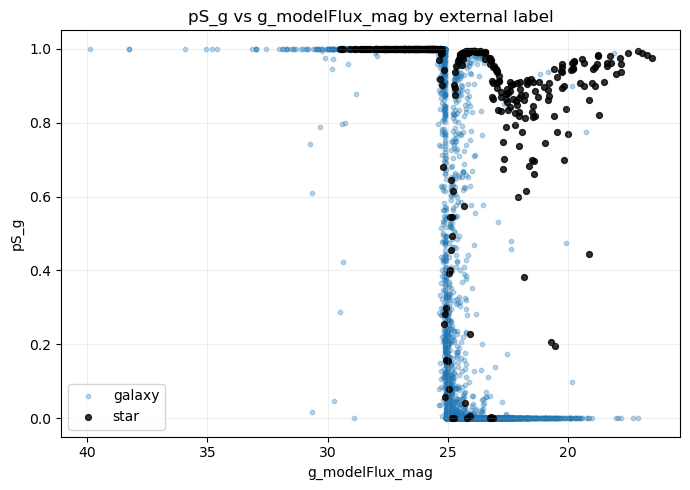

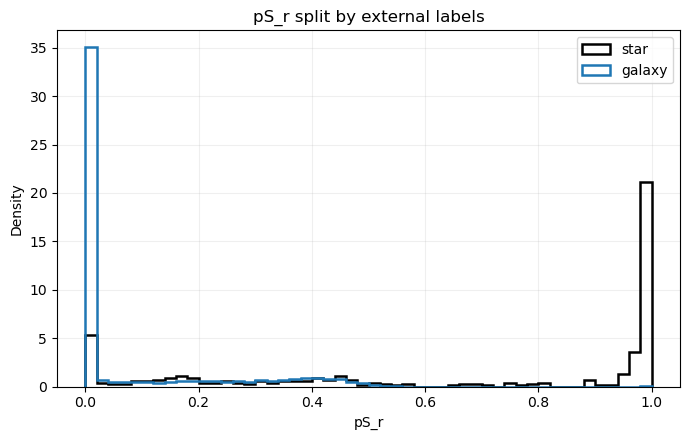

...

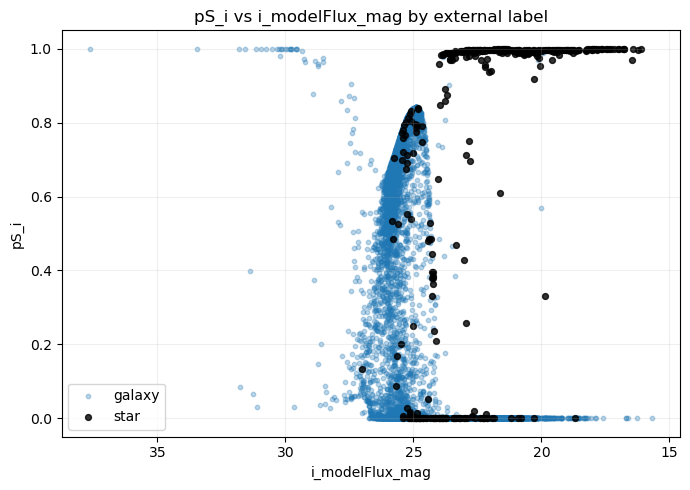

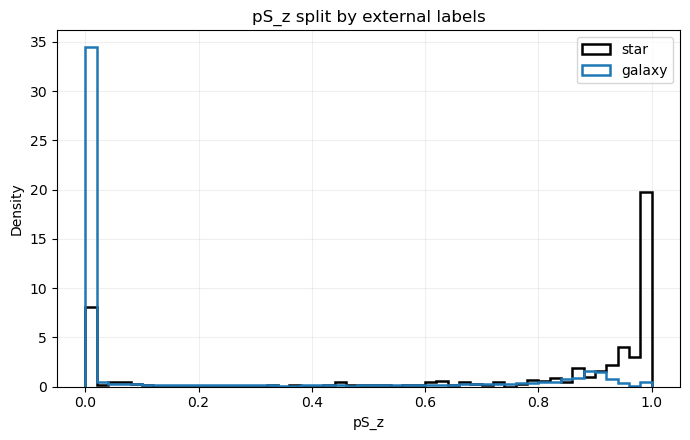

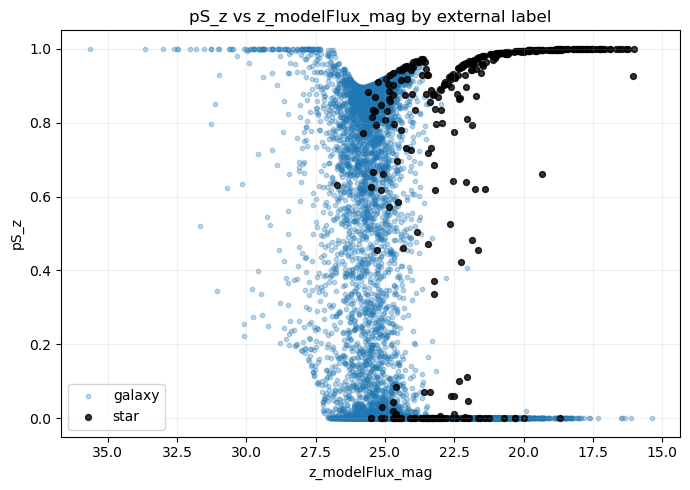

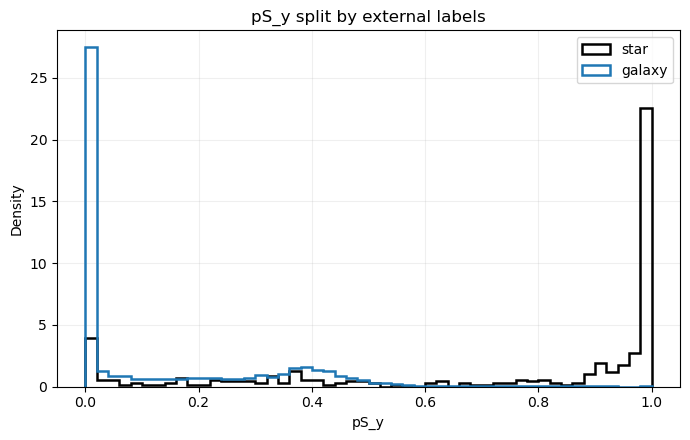

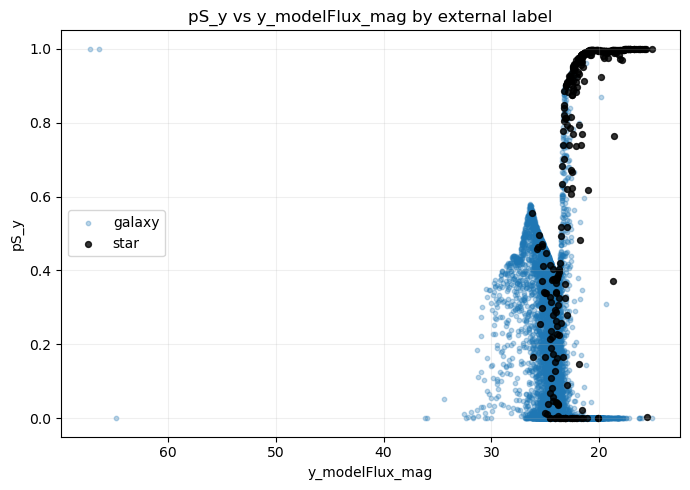

Generated per-band pS plot files:
   pS_hist_DP2_ECDFS_HST_u.png
   pS_vs_mag_DP2_ECDFS_HST_u.png
   pS_hist_DP2_ECDFS_HST_g.png
   pS_vs_mag_DP2_ECDFS_HST_g.png
   pS_hist_DP2_ECDFS_HST_r.png
   pS_vs_mag_DP2_ECDFS_HST_r.png
   pS_hist_DP2_ECDFS_HST_i.png
   pS_vs_mag_DP2_ECDFS_HST_i.png
   pS_hist_DP2_ECDFS_HST_z.png
   pS_vs_mag_DP2_ECDFS_HST_z.png
   pS_hist_DP2_ECDFS_HST_y.png
   pS_vs_mag_DP2_ECDFS_HST_y.png


In [23]:
generated_plot_files = []

for band in available_ps_bands:
    hist_name = f'pS_hist_DP2_ECDFS_HST_{band}.png'
    score_mag_name = f'pS_vs_mag_DP2_ECDFS_HST_{band}.png'

    elt.plot_score_hist_by_label(ecdfs_labeled_use, f'pS_{band}', name=hist_name)
    elt.plot_score_vs_mag_by_label(ecdfs_labeled_use, f'pS_{band}', f'{band}_modelFlux_mag', name=score_mag_name)

    generated_plot_files.extend([hist_name, score_mag_name])

print('Generated per-band pS plot files:')
for name in generated_plot_files:
    print('  ', name)

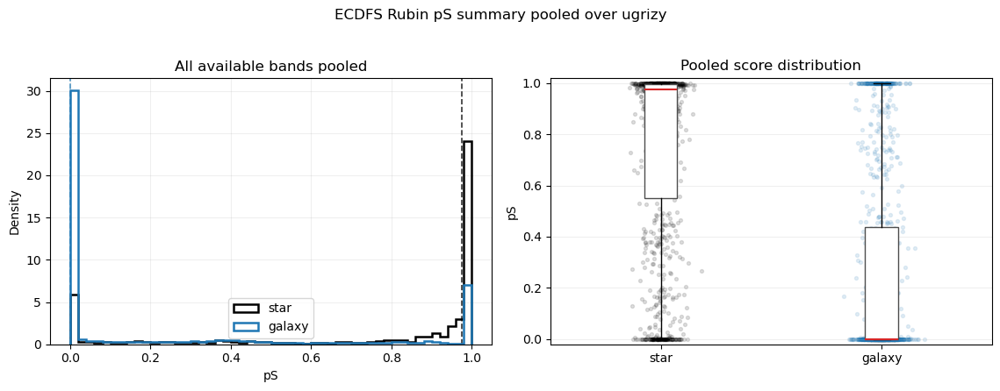

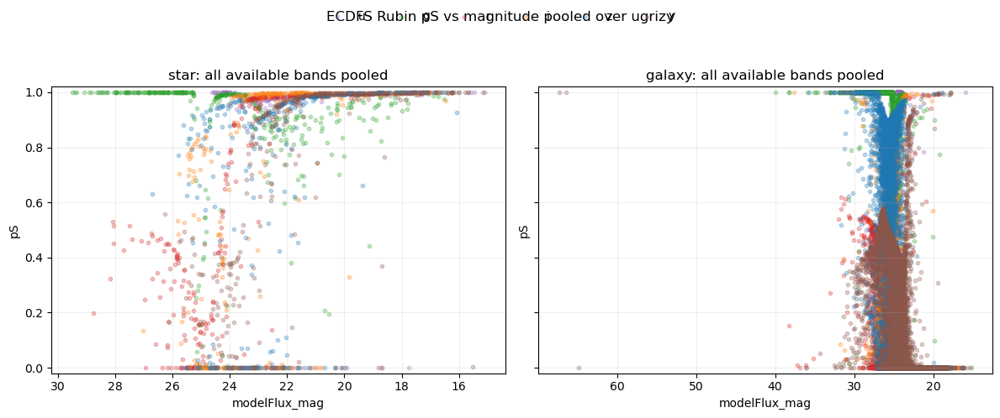

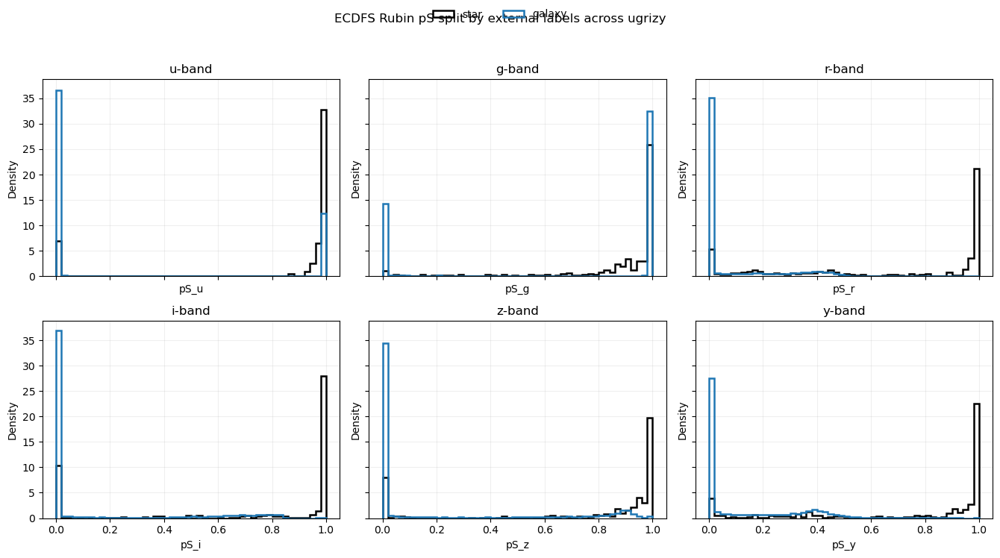

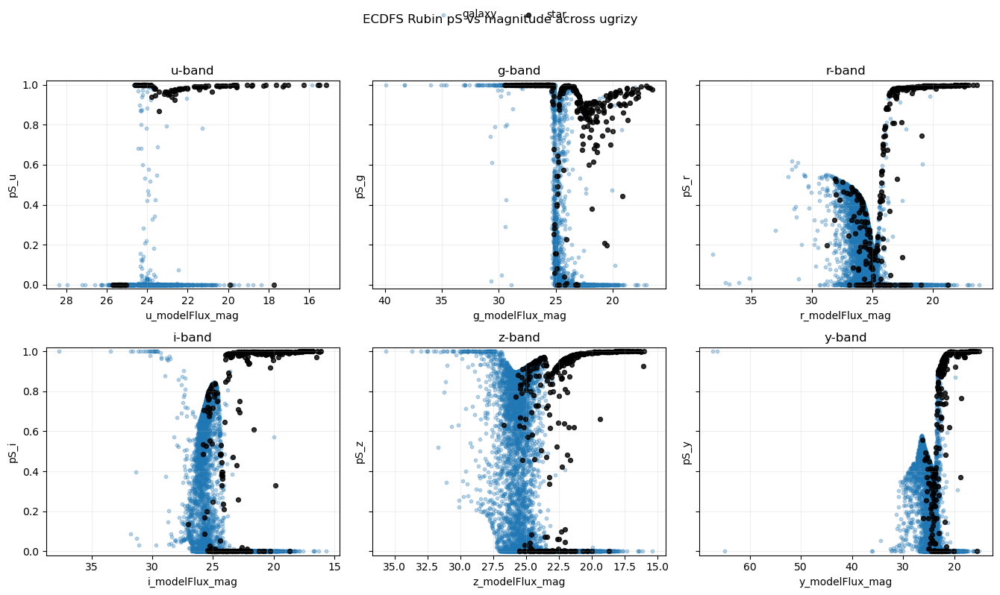

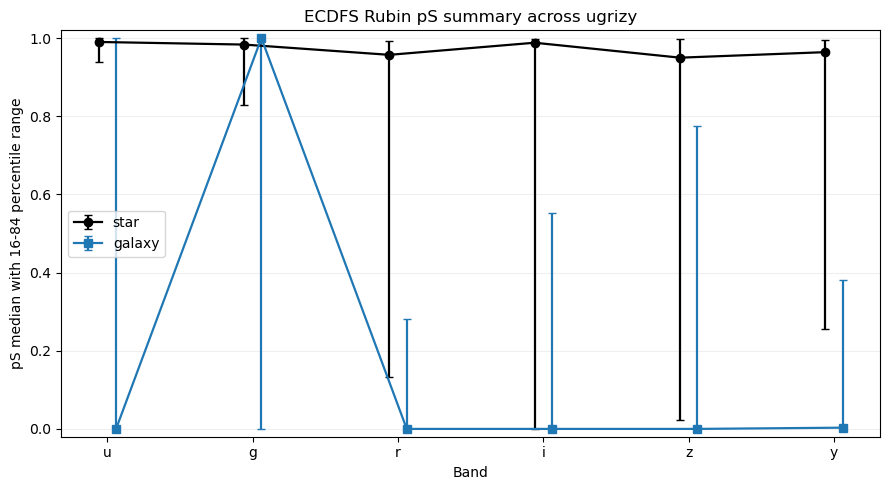

,band,label,count,mean,median,std,p16,p84
0,g,galaxy,13229,0.677664,1.000000e+00,0.457310,8.975225e-30,1.000000
1,g,star,341,0.888424,9.835899e-01,0.216109,8.288711e-01,1.000000
2,i,galaxy,13451,0.143228,1.346944e-47,0.272469,0.000000e+00,0.552320
3,i,star,347,0.709210,9.882858e-01,0.408700,5.322403e-05,0.997003
4,r,galaxy,13376,0.085113,8.300327e-18,0.152463,1.701577e-313,0.281772
5,r,star,346,0.652851,9.572881e-01,0.391479,1.319685e-01,0.993759
6,u,galaxy,2757,0.255654,5.695165e-77,0.433303,0.000000e+00,1.000000
7,u,star,116,0.849758,9.902519e-01,0.341879,9.393653e-01,0.999966
8,y,galaxy,10657,0.136614,3.166413e-03,0.189040,3.450341e-58,0.380935
9,y,star,344,0.734284,9.641937e-01,0.357814,2.562616e-01,0.996197


In [24]:
ps_band_summary = elt.summarize_multiband_scores(ecdfs_labeled_use, available_ps_bands)
ps_band_summary.to_csv('../data/ecdfs_dp2_ps_band_summary.csv', index=False)

elt.plot_pooled_multiband_score_summary(
    ecdfs_labeled_use,
    available_ps_bands,
    name='pS_summary_DP2_ECDFS_HST_ugrizy.png',
)

elt.plot_pooled_multiband_score_vs_mag(
    ecdfs_labeled_use,
    available_ps_bands,
    name='pS_vs_mag_DP2_ECDFS_HST_ugrizy.png',
)

elt.plot_multiband_score_hist_grid(
    ecdfs_labeled_use,
    available_ps_bands,
    name='pS_hist_DP2_ECDFS_HST_ugrizy_grid.png',
)

elt.plot_multiband_score_vs_mag_grid(
    ecdfs_labeled_use,
    available_ps_bands,
    name='pS_vs_mag_DP2_ECDFS_HST_ugrizy_grid.png',
)

elt.plot_multiband_score_summary(
    ecdfs_labeled_use,
    available_ps_bands,
    name='pS_summary_by_band_DP2_ECDFS_HST_ugrizy.png',
)

ps_band_summary[['band', 'label', 'count', 'mean', 'median', 'std', 'p16', 'p84']]

## NATIVE RUBIN EXTENDEDNESS ADD-ON
This section keeps the existing `pS` workflow intact and adds the native Rubin `extendedness` quantity in parallel, using the same clean ECDFS external-label sample. If an `{band}_extendedness_flag` column exists, flagged values are excluded before plotting.

u: 2176 finite unflagged extendedness values
g: 7297 finite unflagged extendedness values
r: 8358 finite unflagged extendedness values
i: 12339 finite unflagged extendedness values
z: 7832 finite unflagged extendedness values
y: 3068 finite unflagged extendedness values


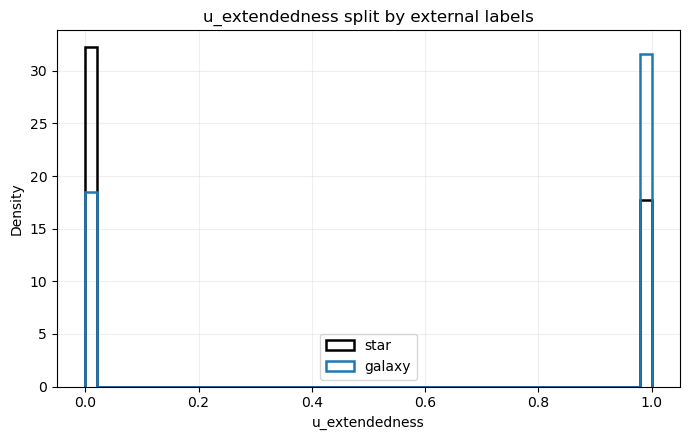

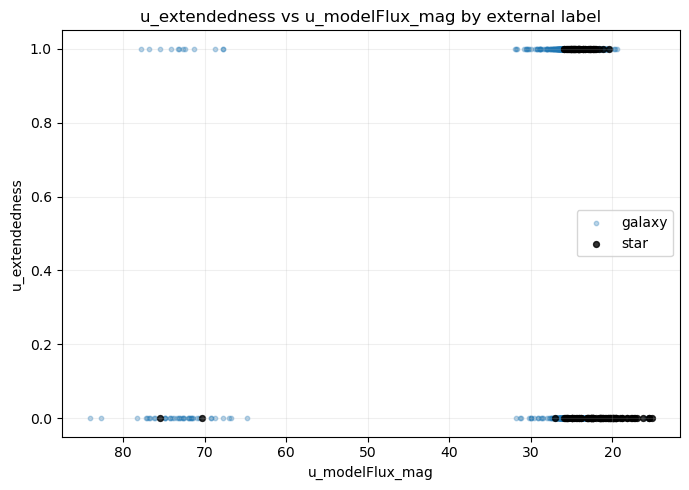

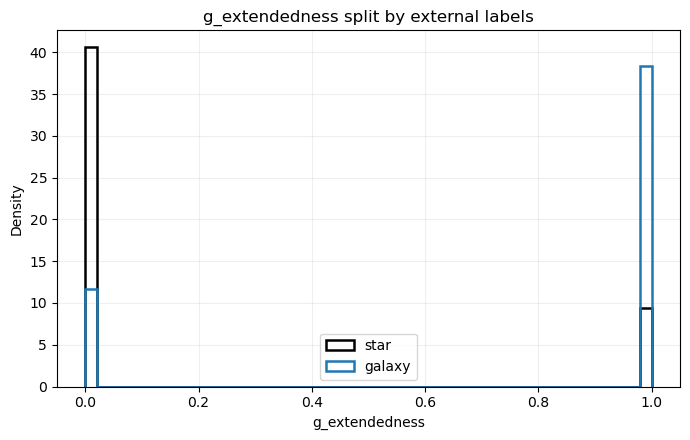

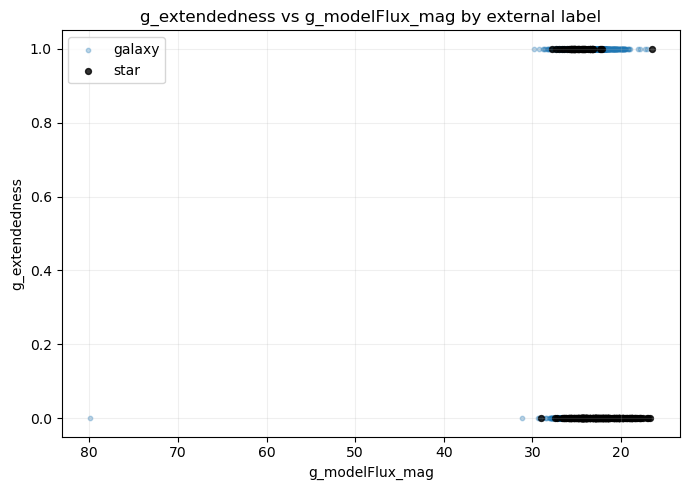

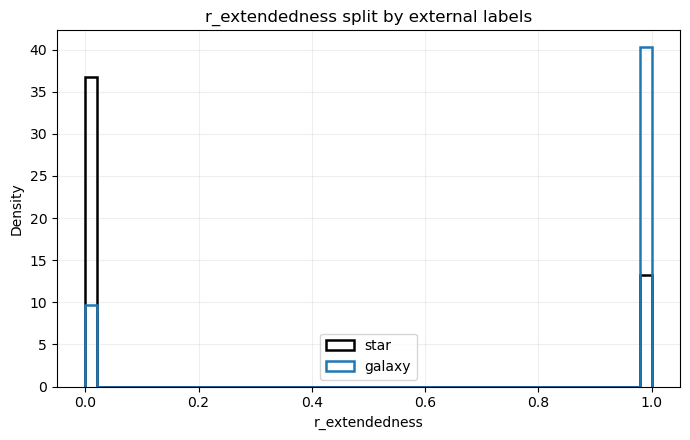

...

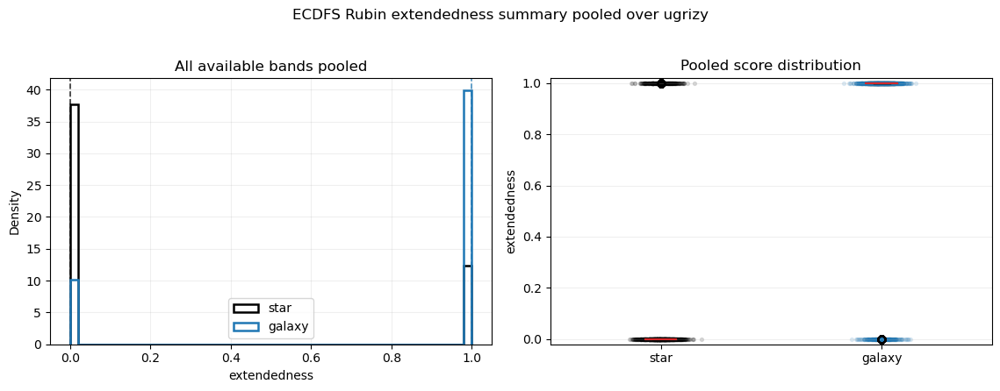

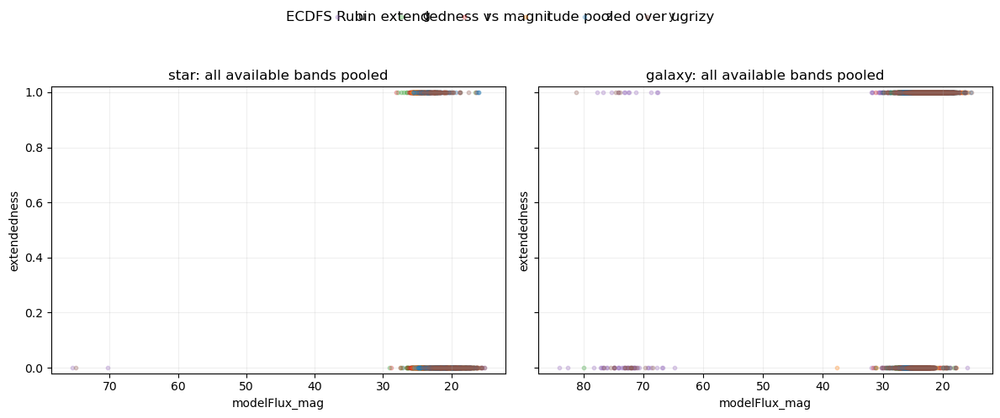

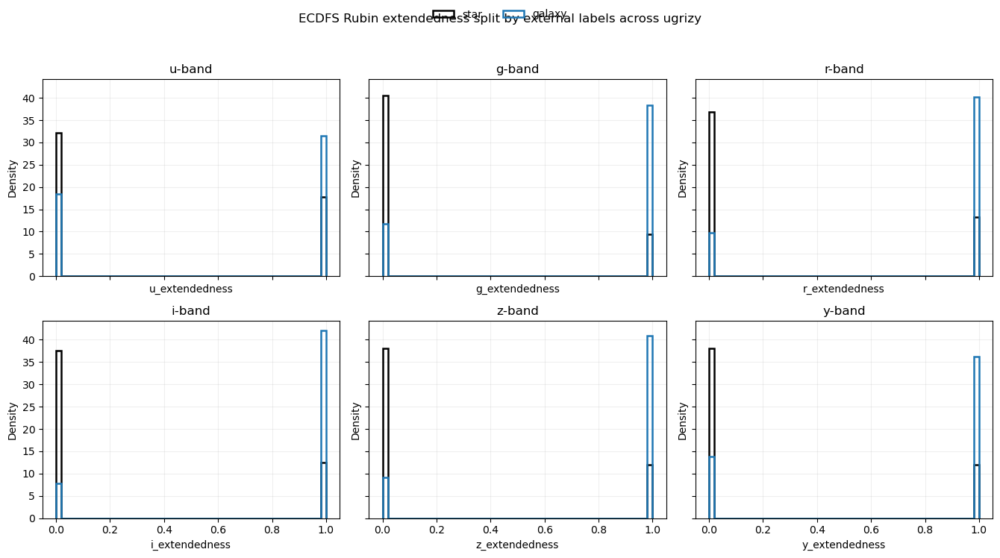

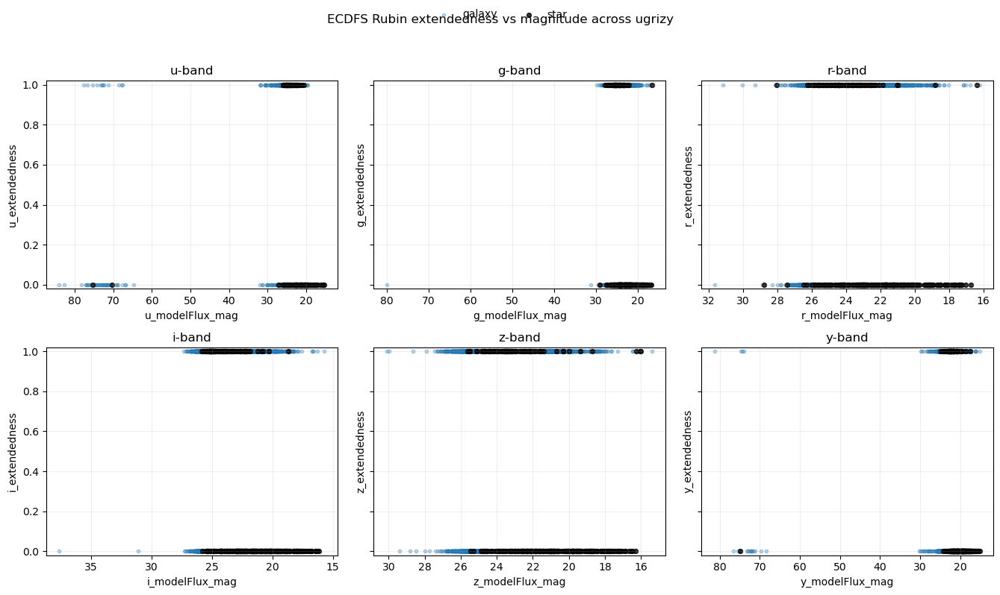

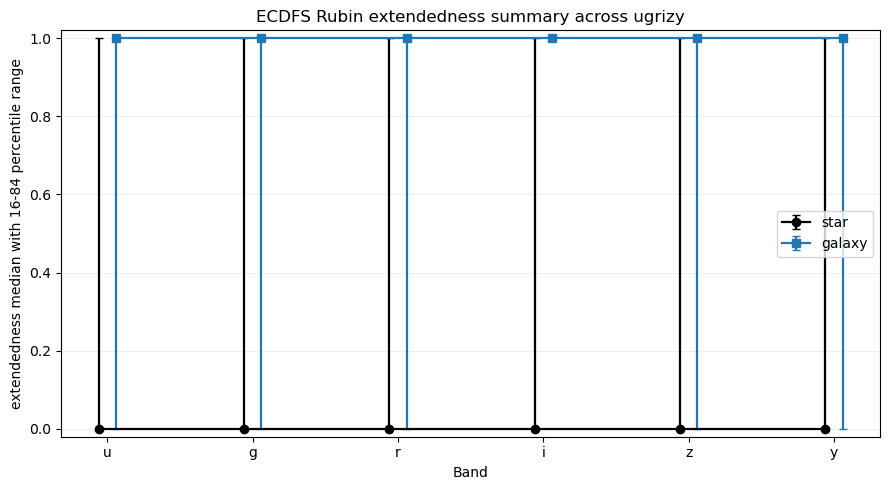

Generated per-band extendedness plot files:
   extendedness_hist_DP2_ECDFS_HST_u.png
   extendedness_vs_mag_DP2_ECDFS_HST_u.png
   extendedness_hist_DP2_ECDFS_HST_g.png
   extendedness_vs_mag_DP2_ECDFS_HST_g.png
   extendedness_hist_DP2_ECDFS_HST_r.png
   extendedness_vs_mag_DP2_ECDFS_HST_r.png
   extendedness_hist_DP2_ECDFS_HST_i.png
   extendedness_vs_mag_DP2_ECDFS_HST_i.png
   extendedness_hist_DP2_ECDFS_HST_z.png
   extendedness_vs_mag_DP2_ECDFS_HST_z.png
   extendedness_hist_DP2_ECDFS_HST_y.png
   extendedness_vs_mag_DP2_ECDFS_HST_y.png


,band,label,count,mean,median,std,p16,p84
0,g,galaxy,7042,0.765976,1.0,0.423418,0.0,1.0
1,g,star,255,0.188235,0.0,0.391669,0.0,1.0
2,i,galaxy,11997,0.842627,1.0,0.364167,1.0,1.0
3,i,star,342,0.248538,0.0,0.432799,0.0,1.0
4,r,galaxy,8059,0.805311,1.0,0.395986,0.0,1.0
5,r,star,299,0.264214,0.0,0.441653,0.0,1.0
6,u,galaxy,2055,0.631144,1.0,0.482612,0.0,1.0
7,u,star,121,0.355372,0.0,0.480616,0.0,1.0
8,y,galaxy,2818,0.723918,1.0,0.447137,0.0,1.0
9,y,star,250,0.240000,0.0,0.427940,0.0,1.0


In [25]:
ecdfs_extendedness_use = ecdfs_labeled_use.copy()
available_extendedness_bands = []

for band in all_ps_bands:
    ext_col = f'{band}_extendedness'
    mag_col = f'{band}_modelFlux_mag'
    flag_col = f'{band}_extendedness_flag'

    if ext_col not in ecdfs_extendedness_use.columns or mag_col not in ecdfs_extendedness_use.columns:
        print(f'Skipping {band} extendedness: missing Rubin columns')
        continue

    ext_values = pd.to_numeric(ecdfs_extendedness_use[ext_col], errors='coerce')
    if flag_col in ecdfs_extendedness_use.columns:
        good_flag = pd.to_numeric(ecdfs_extendedness_use[flag_col], errors='coerce').fillna(1).eq(0)
        ext_values = ext_values.where(good_flag)

    ecdfs_extendedness_use[ext_col] = ext_values
    n_good = int(np.isfinite(ext_values).sum())
    if n_good == 0:
        print(f'Skipping {band} extendedness: no finite unflagged values')
        continue

    available_extendedness_bands.append(band)
    print(f'{band}: {n_good} finite unflagged extendedness values')

if not available_extendedness_bands:
    raise ValueError('No usable Rubin extendedness bands found in the ECDFS DP2 labeled sample.')

generated_extendedness_plot_files = []
for band in available_extendedness_bands:
    hist_name = f'extendedness_hist_DP2_ECDFS_HST_{band}.png'
    score_mag_name = f'extendedness_vs_mag_DP2_ECDFS_HST_{band}.png'

    elt.plot_score_hist_by_label(
        ecdfs_extendedness_use,
        f'{band}_extendedness',
        bins=np.linspace(0, 1, 51),
        name=hist_name,
    )
    elt.plot_score_vs_mag_by_label(
        ecdfs_extendedness_use,
        f'{band}_extendedness',
        f'{band}_modelFlux_mag',
        name=score_mag_name,
    )

    generated_extendedness_plot_files.extend([hist_name, score_mag_name])

extendedness_band_summary = elt.summarize_multiband_scores(
    ecdfs_extendedness_use,
    available_extendedness_bands,
    score_prefix='',
    score_suffix='_extendedness',
)
extendedness_band_summary.to_csv('../data/ecdfs_dp2_extendedness_band_summary.csv', index=False)

elt.plot_pooled_multiband_score_summary(
    ecdfs_extendedness_use,
    available_extendedness_bands,
    score_prefix='',
    score_suffix='_extendedness',
    score_label='extendedness',
    name='extendedness_summary_DP2_ECDFS_HST_ugrizy.png',
)

elt.plot_pooled_multiband_score_vs_mag(
    ecdfs_extendedness_use,
    available_extendedness_bands,
    score_prefix='',
    score_suffix='_extendedness',
    score_label='extendedness',
    name='extendedness_vs_mag_DP2_ECDFS_HST_ugrizy.png',
)

elt.plot_multiband_score_hist_grid(
    ecdfs_extendedness_use,
    available_extendedness_bands,
    score_prefix='',
    score_suffix='_extendedness',
    score_label='extendedness',
    name='extendedness_hist_DP2_ECDFS_HST_ugrizy_grid.png',
)

elt.plot_multiband_score_vs_mag_grid(
    ecdfs_extendedness_use,
    available_extendedness_bands,
    score_prefix='',
    score_suffix='_extendedness',
    score_label='extendedness',
    name='extendedness_vs_mag_DP2_ECDFS_HST_ugrizy_grid.png',
)

elt.plot_multiband_score_summary(
    ecdfs_extendedness_use,
    available_extendedness_bands,
    score_prefix='',
    score_suffix='_extendedness',
    score_label='extendedness',
    name='extendedness_summary_by_band_DP2_ECDFS_HST_ugrizy.png',
)

print('Generated per-band extendedness plot files:')
for name in generated_extendedness_plot_files:
    print('  ', name)

extendedness_band_summary[['band', 'label', 'count', 'mean', 'median', 'std', 'p16', 'p84']]

## DIRECT `pS` VS `extendedness` COMPARISON
For a direct comparison on the same clean ECDFS HST-labeled sample, we convert Rubin `extendedness` into a star-likeness score `1 - extendedness`, so both axes are high for point sources and low for galaxies.

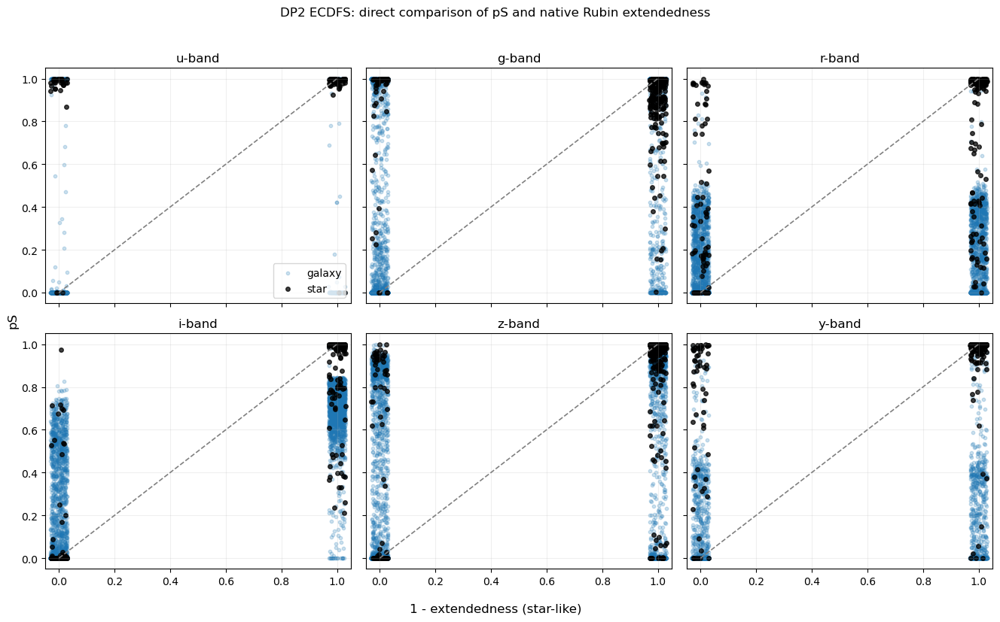

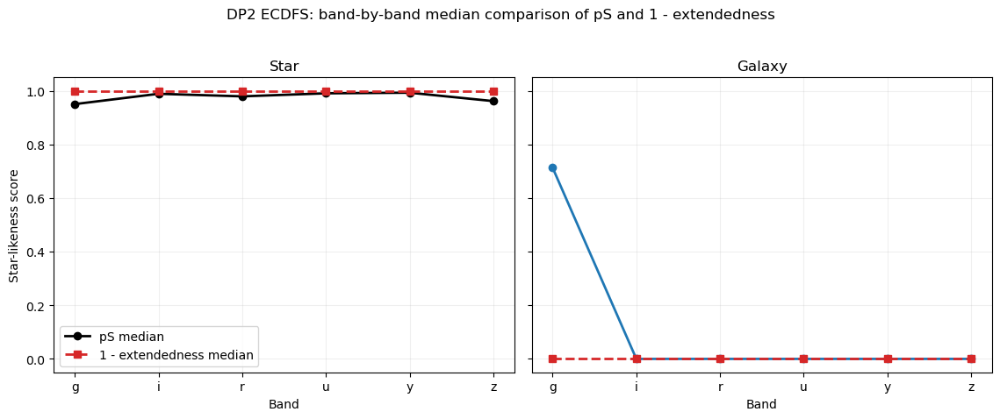

,band,label,count_common,pS_mean,pS_median,extendedness_mean,extendedness_median,extendedness_star_mean,extendedness_star_median,pearson_corr
0,g,galaxy,7038,0.515102,7.129592e-01,0.766269,1.0,0.233731,0.0,0.369873
1,i,galaxy,11996,0.144142,2.110249e-55,0.842614,1.0,0.157386,0.0,0.865766
2,r,galaxy,8057,0.064401,1.930036e-32,0.805387,1.0,0.194613,0.0,0.386853
3,u,galaxy,1047,0.239175,8.102980e-53,0.765043,1.0,0.234957,0.0,0.155407
4,y,galaxy,2738,0.102302,3.135695e-13,0.734843,1.0,0.265157,0.0,0.308933
5,z,galaxy,7513,0.156776,5.318289e-55,0.817250,1.0,0.182750,0.0,0.327466
6,g,star,255,0.872597,9.504808e-01,0.188235,0.0,0.811765,1.0,0.122870
7,i,star,342,0.719184,9.889490e-01,0.248538,0.0,0.751462,1.0,0.893163
8,r,star,298,0.721864,9.793793e-01,0.265101,0.0,0.734899,1.0,0.566985
9,u,star,92,0.931345,9.907463e-01,0.326087,0.0,0.673913,1.0,0.158363


In [26]:
compare_bands = [band for band in all_ps_bands if band in available_ps_bands and band in available_extendedness_bands]
if not compare_bands:
    raise ValueError('No common bands with both pS and extendedness available for direct comparison.')

rng = np.random.default_rng(12345)
comparison_rows = []
fig, axes = plt.subplots(2, 3, figsize=(13.5, 8.0), sharex=True, sharey=True)
axes = axes.ravel()

for ax, band in zip(axes, compare_bands):
    ps_col = f'pS_{band}'
    ext_col = f'{band}_extendedness'
    use = ecdfs_extendedness_use[
        np.isfinite(ecdfs_extendedness_use[ps_col])
        & np.isfinite(ecdfs_extendedness_use[ext_col])
        & ecdfs_extendedness_use['external_label'].isin(['star', 'galaxy'])
    ][['external_label', ps_col, ext_col]].copy()

    use['extendedness_star_score'] = 1.0 - use[ext_col]
    use['ext_star_score_jitter'] = np.clip(
        use['extendedness_star_score'] + rng.uniform(-0.03, 0.03, size=len(use)),
        -0.05,
        1.05,
    )

    for label, color, alpha, size in [('galaxy', 'tab:blue', 0.22, 10), ('star', 'black', 0.75, 16)]:
        sub = use[use['external_label'] == label]
        if len(sub) == 0:
            continue
        ax.scatter(sub['ext_star_score_jitter'], sub[ps_col], c=color, alpha=alpha, s=size, label=label)

    ax.plot([0, 1], [0, 1], ls='--', lw=1.2, color='0.5')
    ax.set_title(f'{band}-band')
    ax.set_xlim(-0.05, 1.05)
    ax.set_ylim(-0.05, 1.05)
    ax.grid(True, alpha=0.2)

    for label in ['star', 'galaxy']:
        sub = use[use['external_label'] == label]
        if len(sub) == 0:
            continue
        comparison_rows.append({
            'band': band,
            'label': label,
            'count_common': int(len(sub)),
            'pS_mean': float(sub[ps_col].mean()),
            'pS_median': float(sub[ps_col].median()),
            'extendedness_mean': float(sub[ext_col].mean()),
            'extendedness_median': float(sub[ext_col].median()),
            'extendedness_star_mean': float((1.0 - sub[ext_col]).mean()),
            'extendedness_star_median': float((1.0 - sub[ext_col]).median()),
            'pearson_corr': float(sub[ps_col].corr(1.0 - sub[ext_col])) if len(sub) > 1 else np.nan,
        })

for ax in axes[len(compare_bands):]:
    ax.set_visible(False)

axes[0].legend(loc='lower right', frameon=True)
fig.supxlabel('1 - extendedness (star-like)')
fig.supylabel('pS')
fig.suptitle("DP2 ECDFS: direct comparison of pS and native Rubin extendedness", y=1.02)
plt.tight_layout()
plt.savefig('../plots/pS_vs_extendedness_DP2_ECDFS_HST_ugrizy_grid.png', dpi=200, bbox_inches='tight')
plt.show()

ps_ext_compare = pd.DataFrame(comparison_rows).sort_values(['label', 'band']).reset_index(drop=True)
ps_ext_compare.to_csv('../data/ecdfs_dp2_ps_extendedness_comparison_summary.csv', index=False)

fig, axes = plt.subplots(1, 2, figsize=(11.5, 4.6), sharey=True)
for ax, label, color in [(axes[0], 'star', 'black'), (axes[1], 'galaxy', 'tab:blue')]:
    sub = ps_ext_compare[ps_ext_compare['label'] == label].sort_values('band')
    ax.plot(sub['band'], sub['pS_median'], marker='o', lw=2.0, color=color, label='pS median')
    ax.plot(sub['band'], sub['extendedness_star_median'], marker='s', lw=2.0, ls='--', color='tab:red', label='1 - extendedness median')
    ax.set_title(label.title())
    ax.set_xlabel('Band')
    ax.set_ylim(-0.05, 1.05)
    ax.grid(True, alpha=0.2)

axes[0].set_ylabel('Star-likeness score')
axes[0].legend(loc='best')
fig.suptitle('DP2 ECDFS: band-by-band median comparison of pS and 1 - extendedness', y=1.03)
plt.tight_layout()
plt.savefig('../plots/pS_vs_extendedness_summary_DP2_ECDFS_HST_ugrizy.png', dpi=200, bbox_inches='tight')
plt.show()

ps_ext_compare

<!-- DP2_STANDARD_EXTERNAL_VALIDATION_2026_05_07 -->
## Standardized DP2 external-validation outputs

This section is shared across the DP2 notebook versions. The pS model above remains version-specific; the validation and matching logic below is the same for each version.

It saves per-object pS outputs for ECDFS and COSMOS, then uses the shared DP2 external-validation scripts to compare:

- DP2 ECDFS against the HST/GOODS-S external validation catalog
- DP2 COSMOS against COSMOS2020 FARMER external validation labels
- pS against external labels
- Rubin extendedness against external labels
- pS against Rubin extendedness on common samples

COSMOS2020 labels are treated as external validation labels, not perfect truth.


In [27]:
from pathlib import Path
import numpy as np
import pandas as pd
import sys

if '../src' not in sys.path:
    sys.path.append('../src')
import psf_cmodel_fit as pcf

PS_VERSION = 'v1'
ALL_PS_BANDS = ['u', 'g', 'r', 'i', 'z', 'y']
FIELD_NAMES = ['ecdfs', 'cosmos']
OUT_DIR = Path('../outputs')
OUT_DIR.mkdir(parents=True, exist_ok=True)

model_dict = {}
if 'abs_models' in globals():
    model_dict.update(abs_models)
if 'binned_models' in globals():
    model_dict.update(binned_models)

if not model_dict:
    raise RuntimeError('No pS model dictionary found. Run the notebook model-fitting cells first.')

def save_standard_ps_output(field_index, field_name):
    df = data_mag[field_index]
    out = pd.DataFrame()
    if 'objectId' in df.columns:
        out['object_id'] = pd.to_numeric(df['objectId'], errors='coerce').astype('Int64')
    elif 'object_id' in df.columns:
        out['object_id'] = pd.to_numeric(df['object_id'], errors='coerce').astype('Int64')
    else:
        raise ValueError(f'{field_name}: missing objectId/object_id column')

    if 'coord_ra' in df.columns:
        out['ra'] = pd.to_numeric(df['coord_ra'], errors='coerce')
    if 'coord_dec' in df.columns:
        out['dec'] = pd.to_numeric(df['coord_dec'], errors='coerce')

    available = []
    for band in ALL_PS_BANDS:
        diff_col = f'{band}_diff'
        mag_col = f'{band}_modelFlux_mag'
        if band not in model_dict:
            print(f'{field_name}: skipping {band}, no model for this notebook version')
            continue
        if diff_col not in df.columns or mag_col not in df.columns:
            print(f'{field_name}: skipping {band}, missing {diff_col} or {mag_col}')
            continue
        out[f'pS_{band}'] = pcf.compute_pS(
            pd.to_numeric(df[diff_col], errors='coerce').to_numpy(),
            pd.to_numeric(df[mag_col], errors='coerce').to_numpy(),
            model_dict[band],
        )
        available.append(band)

    out['ps_version'] = PS_VERSION
    out['field'] = field_name.upper()
    output_path = OUT_DIR / f'dp2_{field_name}_ps_{PS_VERSION}.parquet'
    out.to_parquet(output_path, index=False)
    print(f'Wrote {output_path} with {len(out):,} rows and pS bands: {available}')
    return output_path

ps_outputs = {}
for idx, field_name in enumerate(FIELD_NAMES):
    if idx < len(data_mag):
        ps_outputs[field_name] = save_standard_ps_output(idx, field_name)
ps_outputs

/Users/jinshuozhang/Rubin-Work/lsst_stack/conda/envs/lsst-scipipe-10.1.0/lib/python3.12/site-packages/numpy/lib/_polynomial_impl.py:778: RuntimeWarning: invalid value encountered in multiply
  y = y * x + pv
/Users/jinshuozhang/Rubin-Work/lsst_stack/conda/envs/lsst-scipipe-10.1.0/lib/python3.12/site-packages/numpy/lib/_polynomial_impl.py:778: RuntimeWarning: invalid value encountered in multiply
  y = y * x + pv
/Users/jinshuozhang/Rubin-Work/lsst_stack/conda/envs/lsst-scipipe-10.1.0/lib/python3.12/site-packages/numpy/lib/_polynomial_impl.py:778: RuntimeWarning: invalid value encountered in multiply
  y = y * x + pv
/Users/jinshuozhang/Rubin-Work/lsst_stack/conda/envs/lsst-scipipe-10.1.0/lib/python3.12/site-packages/numpy/lib/_polynomial_impl.py:778: RuntimeWarning: invalid value encountered in multiply
  y = y * x + pv
/Users/jinshuozhang/Rubin-Work/lsst_stack/conda/envs/lsst-scipipe-10.1.0/lib/python3.12/site-packages/numpy/lib/_polynomial_impl.py:778: RuntimeWarning: invalid value e

Wrote ../outputs/dp2_ecdfs_ps_v1.parquet with 732,402 rows and pS bands: ['u', 'g', 'r', 'i', 'z', 'y']


/Users/jinshuozhang/Rubin-Work/lsst_stack/conda/envs/lsst-scipipe-10.1.0/lib/python3.12/site-packages/numpy/lib/_polynomial_impl.py:778: RuntimeWarning: invalid value encountered in multiply
  y = y * x + pv
/Users/jinshuozhang/Rubin-Work/lsst_stack/conda/envs/lsst-scipipe-10.1.0/lib/python3.12/site-packages/numpy/lib/_polynomial_impl.py:778: RuntimeWarning: invalid value encountered in multiply
  y = y * x + pv
/Users/jinshuozhang/Rubin-Work/lsst_stack/conda/envs/lsst-scipipe-10.1.0/lib/python3.12/site-packages/numpy/lib/_polynomial_impl.py:778: RuntimeWarning: invalid value encountered in multiply
  y = y * x + pv
/Users/jinshuozhang/Rubin-Work/lsst_stack/conda/envs/lsst-scipipe-10.1.0/lib/python3.12/site-packages/numpy/lib/_polynomial_impl.py:778: RuntimeWarning: invalid value encountered in multiply
  y = y * x + pv
/Users/jinshuozhang/Rubin-Work/lsst_stack/conda/envs/lsst-scipipe-10.1.0/lib/python3.12/site-packages/numpy/lib/_polynomial_impl.py:778: RuntimeWarning: invalid value e

Wrote ../outputs/dp2_cosmos_ps_v1.parquet with 865,287 rows and pS bands: ['u', 'g', 'r', 'i', 'z', 'y']


{'ecdfs': PosixPath('../outputs/dp2_ecdfs_ps_v1.parquet'),
 'cosmos': PosixPath('../outputs/dp2_cosmos_ps_v1.parquet')}

### Run version-specific external validation

The commands below are printed but not executed automatically. They use the standardized pS output from the previous cell and write version-specific products under `results/dp2_*_validation/v1/`.


In [28]:
from pathlib import Path
import sys

repo_root = Path.cwd().resolve().parent if Path.cwd().resolve().name == 'notebooks' else Path.cwd().resolve()
commands = [
    [
        sys.executable,
        str(repo_root / 'scripts' / 'run_dp2_external_validation.py'),
        '--field', 'ECDFS',
        '--dp2-table', str(repo_root / 'outputs' / 'dp2_ecdfs_analysis_table.parquet'),
        '--external-matched', str(repo_root / 'outputs' / 'dp2_ecdfs_hst_matched.parquet'),
        '--ps-table', str(repo_root / 'outputs' / 'dp2_ecdfs_ps_v1.parquet'),
        '--output-dir', str(repo_root / 'results' / 'dp2_ecdfs_hst_validation' / 'v1'),
        '--ps-version', 'v1',
    ],
    [
        sys.executable,
        str(repo_root / 'scripts' / 'run_dp2_external_validation.py'),
        '--field', 'COSMOS',
        '--dp2-table', str(repo_root / 'outputs' / 'dp2_cosmos_analysis_table.parquet'),
        '--external-matched', str(repo_root / 'outputs' / 'dp2_cosmos_cosmos2020_farmer_matched.parquet'),
        '--ps-table', str(repo_root / 'outputs' / 'dp2_cosmos_ps_v1.parquet'),
        '--output-dir', str(repo_root / 'results' / 'dp2_cosmos_external_validation' / 'v1'),
        '--ps-version', 'v1',
    ],
]

for cmd in commands:
    print(' '.join(cmd))

# These validation jobs are intentionally not run automatically when the notebook opens.
# After running the pS-output cell above, uncomment the lines below if you want this
# notebook to launch the version-specific validation products.
# import subprocess
# for cmd in commands:
#     subprocess.run(cmd, check=True)

/Users/jinshuozhang/Rubin-Work/lsst_stack/conda/envs/lsst-scipipe-10.1.0/bin/python /Users/jinshuozhang/Library/CloudStorage/Dropbox/Rubin-Work/Rubin-star-galaxy-classification/star-galaxy-separation/scripts/run_dp2_external_validation.py --field ECDFS --dp2-table /Users/jinshuozhang/Library/CloudStorage/Dropbox/Rubin-Work/Rubin-star-galaxy-classification/star-galaxy-separation/outputs/dp2_ecdfs_analysis_table.parquet --external-matched /Users/jinshuozhang/Library/CloudStorage/Dropbox/Rubin-Work/Rubin-star-galaxy-classification/star-galaxy-separation/outputs/dp2_ecdfs_hst_matched.parquet --ps-table /Users/jinshuozhang/Library/CloudStorage/Dropbox/Rubin-Work/Rubin-star-galaxy-classification/star-galaxy-separation/outputs/dp2_ecdfs_ps_v1.parquet --output-dir /Users/jinshuozhang/Library/CloudStorage/Dropbox/Rubin-Work/Rubin-star-galaxy-classification/star-galaxy-separation/results/dp2_ecdfs_hst_validation/v1 --ps-version v1
/Users/jinshuozhang/Rubin-Work/lsst_stack/conda/envs/lsst-scipipe

<!-- DP2_KEY_FIGURE_GALLERY_2026_05_07 -->
## Key DP2 validation figures

These figures are generated by the shared DP2 scripts and saved under `results/`. This notebook displays the saved products for quick review; it does not rerun the heavy validation pipeline.

### Field-level sanity checks

| ECDFS clean CMD | COSMOS clean CMD |
|---|---|
| ![ECDFS clean CMD](../results/dp2_ecdfs/cmd_clean_zoom.png) | ![COSMOS clean CMD](../results/dp2_cosmos/cmd_clean_zoom.png) |

| ECDFS footprint | COSMOS footprint |
|---|---|
| ![ECDFS footprint](../results/dp2_ecdfs/footprint.png) | ![COSMOS footprint](../results/dp2_cosmos/footprint.png) |

### Version-specific external validation: v1

| ECDFS HST: pS r-band CMD | COSMOS2020: pS r-band CMD |
|---|---|
| ![ECDFS pS r CMD](../results/dp2_ecdfs_hst_validation/v1/cmd_four_panel_pS_r_vs_external.png) | ![COSMOS pS r CMD](../results/dp2_cosmos_external_validation/v1/cmd_four_panel_pS_r_vs_external.png) |

| ECDFS HST: metrics vs i | COSMOS2020: metrics vs i |
|---|---|
| ![ECDFS pS r metrics](../results/dp2_ecdfs_hst_validation/v1/metrics_vs_i_pS_r_vs_external.png) | ![COSMOS pS r metrics](../results/dp2_cosmos_external_validation/v1/metrics_vs_i_pS_r_vs_external.png) |

### Cross-version comparison summary

| ECDFS r-band purity/completeness | COSMOS r-band purity/completeness |
|---|---|
| ![ECDFS version comparison r](../results/dp2_ps_version_comparison/ecdfs/purity_completeness_r.png) | ![COSMOS version comparison r](../results/dp2_ps_version_comparison/cosmos/purity_completeness_r.png) |

